In [2]:
!pip install imageio

In [2]:
import geopandas as gpd
import pandas as pd
import contextily as ctx
import numpy as np
import random
import geojson
import rasterio
from rasterio.mask import mask
from rasterio.merge import merge
from rasterio.features import shapes
from rasterio.transform import from_origin
from rasterio.warp import calculate_default_transform, reproject, Resampling
import matplotlib.pyplot as plt
import shapely
from shapely.geometry import Point, LineString, Polygon, shape
import os
import requests
import zipfile
import io
import glob
import folium
import time
from datetime import timedelta
import math
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
import chardet
import statistics as stats
from pathlib import Path
import imageio.v3 as iio

directory = r'C:\Users\ericg\IBM_SI' # Change to your personal directory
os.chdir(directory)

# Set up vector data (squirrel individuals and boundaries)

In [3]:
# Bring in study area polygon
siBoundary = gpd.read_file(r'C:\Users\ericg\siBoundary_gJ.geojson')

# Set crs
siBoundary.set_crs('epsg:4326')

,id,0,geometry
0,0,1,"MULTIPOLYGON (((-109.2671 26.5, -109.26771 26...."


## Add Mount Graham Red Squirrel Data

In [4]:
# Define a function to add .csv data and convert it to a GeoJSON
def CSV_to_GDF_and_GJ(csvFile,outGJ):

    # Use .read_csv() function to convert a .csv file to a DF
    df = pd.read_csv(csvFile)
    
    # Create a geometry column using the lat and lon fields
    geom = [Point(xy) for xy in zip(df['decimalLongitude'],df['decimalLatitude'])]
    
    # Create GDF from lats and lons in DF
    gdf = gpd.GeoDataFrame(df, geometry = geom)
    
    # Make sure GDF is WGS84
    gdf.set_crs(epsg = 4326, inplace = True)
    
    # Save siBoundary as GeoJSON
    gJ_string = gdf.to_json()
        
    # Write GeoJSON string to file
    with open(outGJ,'w') as f:
        f.write(gJ_string)

    # Return the GDF
    return gdf

In [13]:
red_squirrel = CSV_to_GDF_and_GJ(r"C:\Users\ericg\IBM_SI\Species_Data\Red Squirrel\Red Squirrel Occurences.csv",'red_squirrel.geojson')

C:\Users\ericg\AppData\Local\Temp\ipykernel_25620\870672995.py:5: DtypeWarning: Columns (2,12,16,19,23,28,31,33,35,38,41,42,43,44,45,53,54,56,57,58,59,60,61,70,73,75,76,77,78,81,82,83,87,90,96,105,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,127,129,131,133,137,138,141,145,147,149,150,151,152,153,173,177,178,204,210) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csvFile)


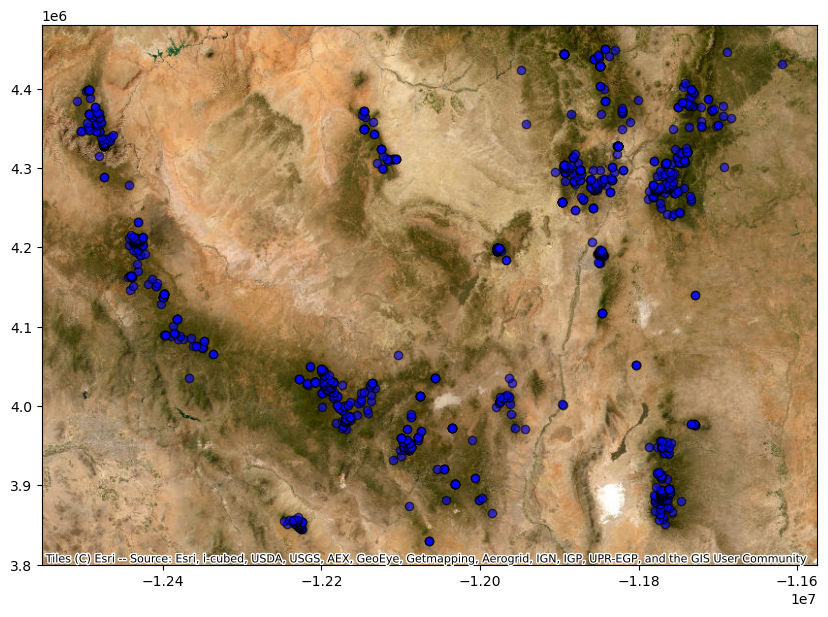

In [5]:
# If the created file does not exist
if os.path.exists('red_squirrel_sw.geojson'):

    # Bring in clipped red squirrel data
    red_squirrel = gpd.read_file('red_squirrel_sw.geojson')

else:

    # Set red_squirrel variable equal to a GDF created from the GJ
    red_squirrel = gpd.read_file('red_squirrel.geojson')
    
    # Remove null coords
    red_squirrel = red_squirrel.dropna(subset=['geometry'])
    
    # Clip red_squirrel data by the siBoundary GDF
    red_squirrel = gpd.clip(red_squirrel,siBoundary)
    
    # Create a geojson with clipped red_squirrel data
    red_squirrel_gj = red_squirrel.to_json()
    with open('red_squirrel_sw.geojson','w') as f:
        f.write(red_squirrel_gj)

    # Bring in clipped red squirrel data
    red_squirrel = gpd.read_file('red_squirrel_sw.geojson')
    
# Convert features to EPSG:3857 for Web Mercator
f3857 = red_squirrel.to_crs(epsg = 3857)
    
# Create the plot
fig, ax = plt.subplots(figsize = (10,10))
    
# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")
    
# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)
    
# Show the plot
plt.show()

In [10]:
mt_graham = CSV_to_GDF_and_GJ(r"C:\Users\ericg\IBM_SI\Species_Data\Mount Graham Red Squirrel\Mount Graham Red Squirrel.csv",'mt_graham_red_squirrel.geojson')

In [6]:
# Make mt_graham equivalent to the geojson
mt_graham = gpd.read_file('mt_graham_red_squirrel.geojson')

# Remove null coordinates
mt_graham = mt_graham.dropna(subset=['geometry'])

In [7]:
# Define a function to turn a raster to a shapefile
def raster_to_shapefile(raster_path, output_shapefile, threshold, operator='>='):

    # Open the raster file
    with rasterio.open(raster_path) as src:

        # Read the first band
        raster = src.read(1)
        transform = src.transform
        crs = src.crs

        # Apply threshold to the raster
        if operator == '>=':
            mask = raster >= threshold
        elif operator == '<=':
            mask = raster <= threshold
        elif operator == '==':
            mask = raster == threshold
        elif operator == '>':
            mask = raster > threshold
        elif operator == '<':
            mask = raster < threshold
        else:
            raise ValueError(f"Unsupported operator: {operator}")

        # Vectorize the raster based on the mask
        shapes_generator = shapes(raster, mask=mask, transform=transform)
        geometries = []
        for geom, value in shapes_generator:

            # Only include shapes with valid values
            if value:
                geometries.append(shape(geom))

    # Create a GeoDataFrame from the geometries
    gdf = gpd.GeoDataFrame(geometry=geometries, crs=crs)

    # Save the GeoDataFrame to a shapefile
    gdf.to_file(output_shapefile)

    print(f"Shapefile saved to {output_shapefile}")

In [99]:
raster_to_shapefile(r"C:\Users\ericg\siRast.tif", 'SI.shp', 27)

Shapefile saved to SI.shp


In [8]:
# Create sky islands gdf
siGDF = gpd.read_file('SI.shp')

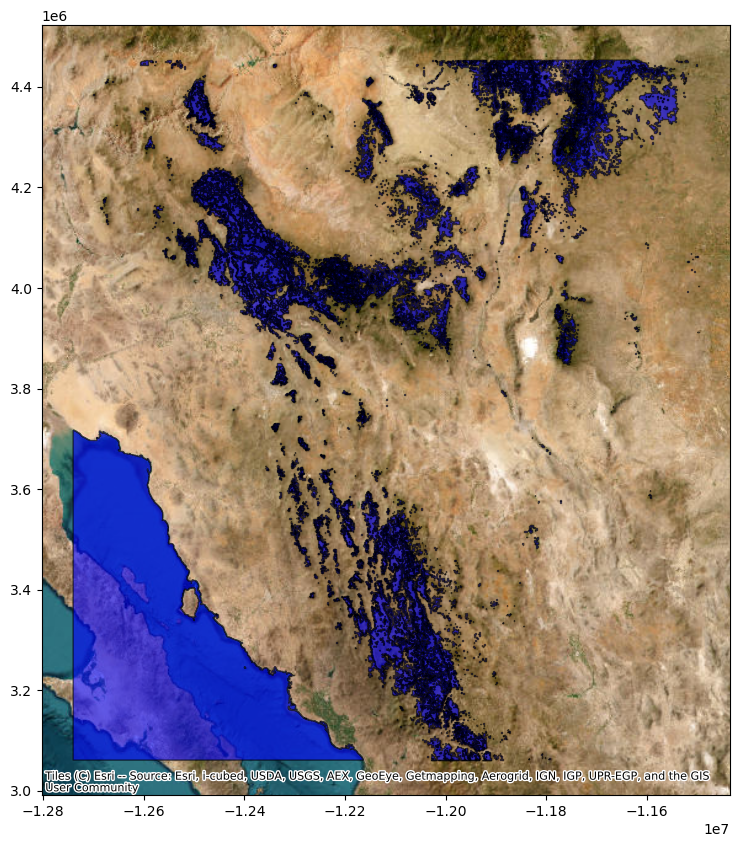

In [8]:
# Convert features to EPSG:3857 for Web Mercator
f3857 = siGDF.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

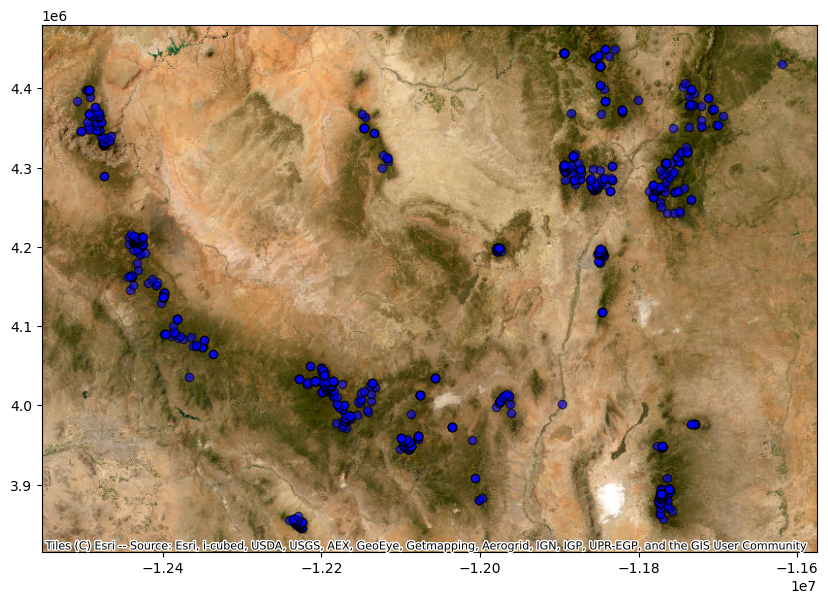

In [9]:
# Clip red squirrel data by the locations of sky islands (QA/QC)
red_squirrel = gpd.clip(red_squirrel,siGDF)

# Display red_squirrel data

# Convert features to EPSG:3857 for Web Mercator
f3857 = red_squirrel.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

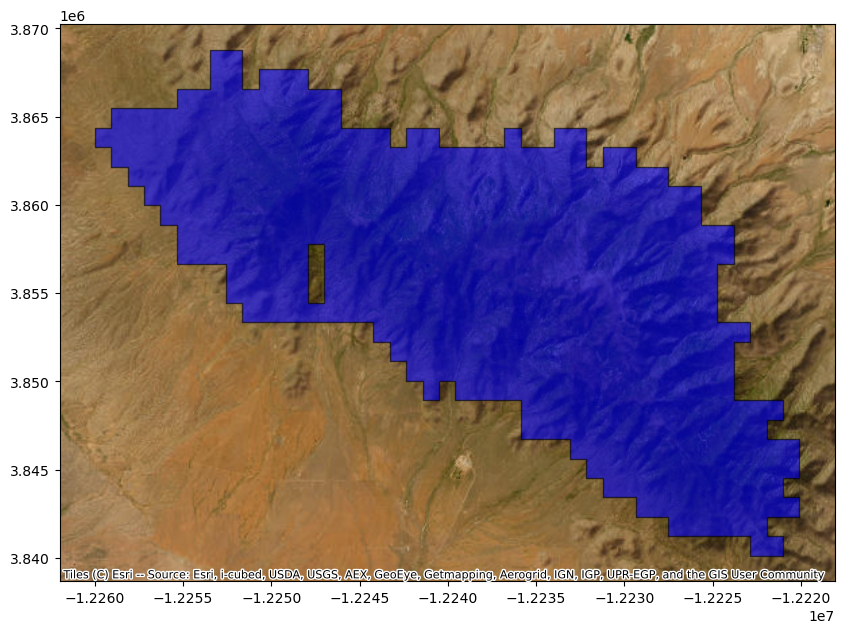

In [10]:
# Create clipping geometry of pinaleno mountains
pinalenoClip = Polygon([[-109.73,32.8],[-110.15,32.8],[-110.15,32.58],[-109.73,32.58]])

# Clip sky islands geodataframe to output just a polygon of the Pinaleno Mountains sky island
pinaleno = gpd.clip(siGDF,pinalenoClip)

# Dissolve the GDF
pinaleno = pinaleno.dissolve()

# Convert features to EPSG:3857 for Web Mercator
f3857 = pinaleno.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

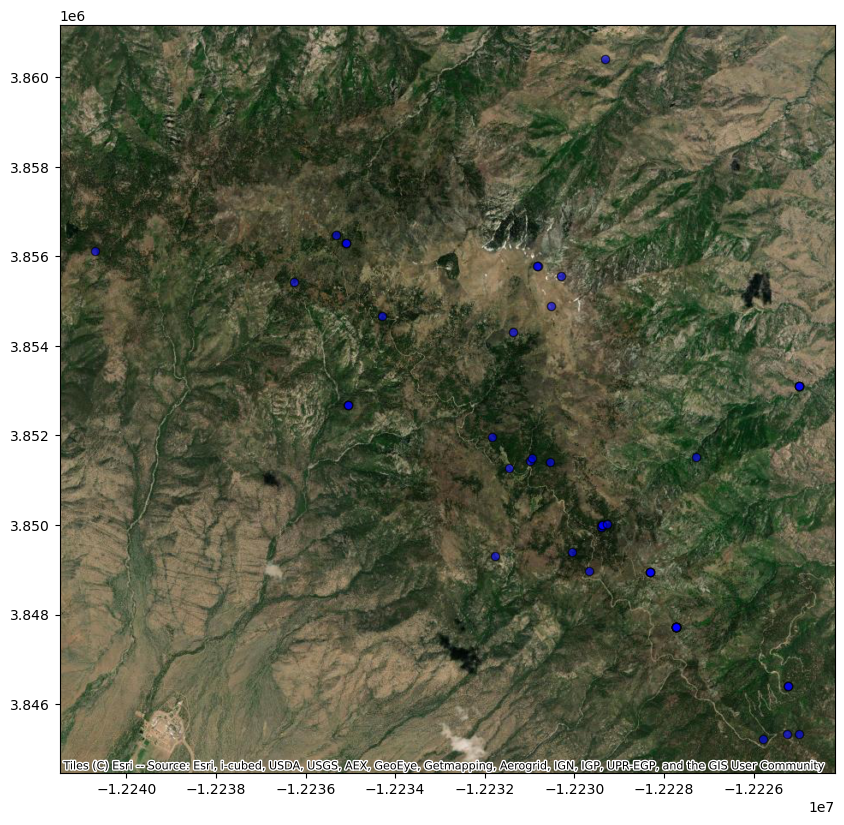

In [11]:
# Create a GDF of Mount Graham Red Squirrels using the Red Squirrels
mt_graham_red_squirrel = gpd.clip(red_squirrel,pinaleno)

# Convert features to EPSG:3857 for Web Mercator
f3857 = mt_graham_red_squirrel.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

# Prepare rasters

## Create a function reproject rasters

In [12]:
# Define a function to reproject rasters
def reprojectRaster(src, outRaster, crs):

    # Use calculate_default_transform function to get the correct projection
    transform, width, height = calculate_default_transform(
        src.crs, crs, src.width, src.height, *src.bounds)

    # Copy metadata and update for the new CRS
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Copy all information into the user-defined output raster
    with rasterio.open(outRaster, 'w', **kwargs) as dst:

        # For all cells in the source raster, reproject
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=crs,
                resampling=Resampling.nearest)

## Clip Rasters

In [13]:
# Define a function to clip the precipitation and temperature data to the study area
def clipRasters(folderPath, studyArea, outPrefix, outFolder):

    # Generate a list on GeoTIFFs utilizing the user-defined folder path
    rastList = glob.glob(os.path.join(folderPath, '*.tif'))

    # Set a value for months
    month = 0
    
    # Iterate through each raster in the raster list
    for raster in rastList:

        # Add one for the month number
        month += 1
        
        # Make sure the rasters have the correct coordinate system
        rast = rasterio.open(raster)

        # Set a variable containing the raster coordinate system
        rastCrs = rast.crs

        # If the clipping polygon has a different coordinate system as the raster
        if studyArea.crs != rastCrs:

            # Set a variable equal to the basename
            basename = os.path.basename(raster)

            # Remove the file type from the name
            base = basename.replace('.tif','')

            # Reproject the raster
            reprojectRaster(rast, os.path.join(folderPath,f'{base}_4326.tif'), 'EPSG:4326')

            # Make the rast variable equal to the reprojected raster
            rast = rasterio.open(os.path.join(folderPath,f'{base}_4326.tif'))
        
        # Convert the polygons to GeoJSON format for rasterio
        polygon_geom = [polygon['geometry'] for polygon in studyArea.to_dict(orient="records")]
        
        # Open the raster and clip it with the polygon
        out_image, out_transform = mask(rast, polygon_geom, crop=True)

        # Assign metadata to a variable
        out_meta = rast.meta.copy()
        
        # Update metadata to match the clipped output
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })
        
        # Save the clipped raster with an output name (1-12 for temp and prec)
        with rasterio.open(os.path.join(outFolder,f'{outPrefix}_{str(month).zfill(2)}.tif'), "w", **out_meta) as dest:
            dest.write(out_image)

    print(f'Done. Rasters saved in {outFolder}.')

## Clip for all of Arizona and New Mexico to find preferences

In [75]:
clipRasters(
    r'C:\Users\ericg\OneDrive\Documents\Evolution Model Sky Islands\Precipitation\wc2.1_30s_prec', 
    siBoundary, 
    'Precipitation',
    'Rasters'
)

Done. Rasters saved in Rasters.


In [76]:
clipRasters(
    r'C:\Users\ericg\OneDrive\Documents\Evolution Model Sky Islands\Temperature\wc2.1_30s_tavg', 
    siBoundary, 
    'Temperature',
    'Rasters'
)

Done. Rasters saved in Rasters.


In [119]:
clipRasters(
    r'C:\Users\ericg\OneDrive\Documents\Evolution Model Sky Islands\Vegetation\Monthly NDVI\NDVI_Rasters',
    siBoundary,
    'NDVI',
    'Rasters'
)

Done. Rasters saved in Rasters.


## Clip for just the Pinaleno Mountains to monitor the Mount Graham Red Squirrel

## Create a list of temperature, precipitation, and NDVI rasters

In [14]:
# Define a function to create a list of rasters to use
def create_pref_raster_list(folder,fileType):

    # Create list of rasters
    rasters = glob.glob(os.path.join(folder, f'*.{fileType}'))
    
    # Create empty list
    rastList = []
    
    # Iterate through each raster
    for raster in rasters:
    
        # Create empty list
        raster_ind_list = []
    
        # Add the raster to a list
        raster_ind_list.append(raster)
    
        # Add unit info
        # If it is a precipitation raster
        if 'Precipitation' in raster:
    
            # Set the units as millimeters
            raster_ind_list.append('Precipitation (mm)')
    
        # If it is a temperature raster
        elif 'Temperature' in raster:
    
            # Set the units as Celsius
            raster_ind_list.append('Temperature (degrees C)')
    
        # If it is an NDVI raster:
        elif 'NDVI' in raster:
    
            # Set the units x10000
            raster_ind_list.append('NDVI Value (x10000)')
    
        # Append the raster_ind_list into the rastList to create a nested list
        rastList.append(raster_ind_list)
    
    # Print the list to make sure it is correct
    return rastList

In [15]:
# Create a preference raster list
rastList = create_pref_raster_list(r'C:\Users\ericg\IBM_SI\Rasters','tif')

# Print to make sure it is correct
print(rastList)

[['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_01.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_02.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_03.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_04.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_05.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_06.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_07.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_08.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_09.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_10.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_11.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\NDVI_12.tif', 'NDVI Value (x10000)'], ['C:\\Users\\ericg\\IBM_SI\\Rasters\\Precipitation_01.tif', 'Precipitation (mm)'], ['C:\\Users\\eri

## Find Preferences

In [16]:
# Create a function which extracts raster values to a point GDF
def create_raster_val_list(rasterPath, ptsGDF):

    # Open the raster to extract values from
    with rasterio.open(rasterPath) as src:

        # Create a coord_list variable
        coords = [(x, y) for x, y in zip(ptsGDF['geometry'].x, ptsGDF['geometry'].y)]

        # Add values into GDF
        ptsGDF['value'] = [x for x in src.sample(coords)]

        # Create a list with values
        valList = ptsGDF['value'].tolist()

        # Transform numpy array values to float
        outList = [val.item() for val in valList]

    # Return the number of true points
    return outList

In [17]:
# Define a function to find preferences of species
def findPrefs(data, rastList, speciesName):

    # Create inanimate dictionary
    listDict = {}
    
    # Iterate through each raster in the list
    for rast in rastList:
    
        # Collect raster values where species occurrence data
        valList = create_raster_val_list(rast[0],data)
    
        # Print mean and standard deviation of the valList
        mean = stats.mean(valList)
        std_dev = stats.stdev(valList)

        # Find basename of file
        rastBase = os.path.basename(rast[0])
    
        # Remove .tif in the raster to use in the title and for the list
        titleInfo = rastBase.replace('.tif','')
    
        # Add lists to a dictionary to reference later
        listDict[f'{titleInfo}'] = valList
    
        # Create figure with axis
        fig, ax = plt.subplots(figsize=(8,6))
        
        # Create a boxplot
        ax.boxplot(valList)
        
        # Set plot title and axis titles
        ax.set_title(f"{speciesName} Preferences - {titleInfo}")
        ax.set_ylabel(rast[1])
        
        # Save the plot
        plt.savefig('Accuracy Assessment Boxplots.png', dpi = 300, bbox_inches = 'tight')
        
        # Show the plot
        plt.show()
    
        # Print the mean and standard deviation values for the points on each raster
        print(f'Mean: {mean}')
        print(f'Standard deviation: {std_dev}')
        print('')

    # Return the listDict
    return listDict

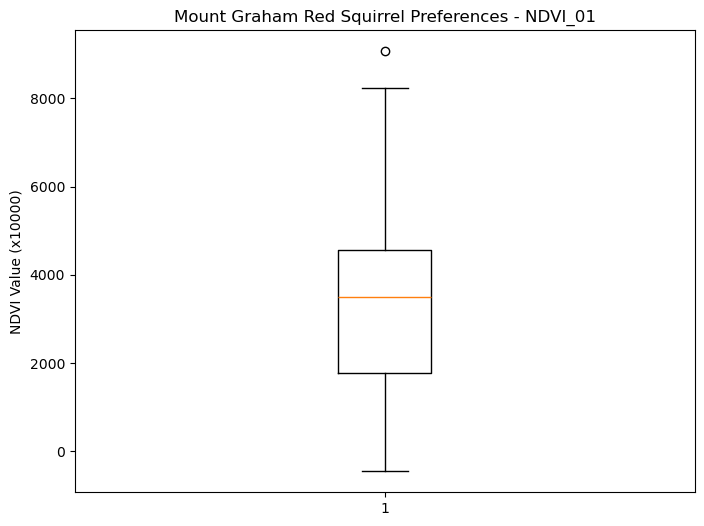

Mean: 3285.593725490196
Standard deviation: 1932.3645327020324



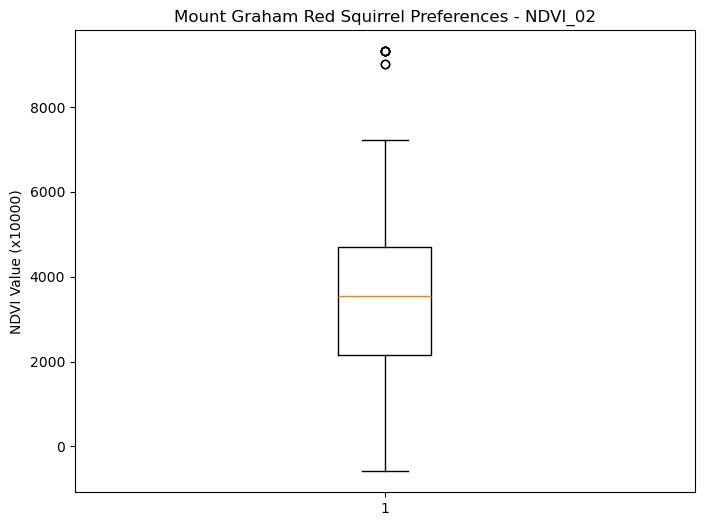

Mean: 3380.749019607843
Standard deviation: 1803.2148535964827



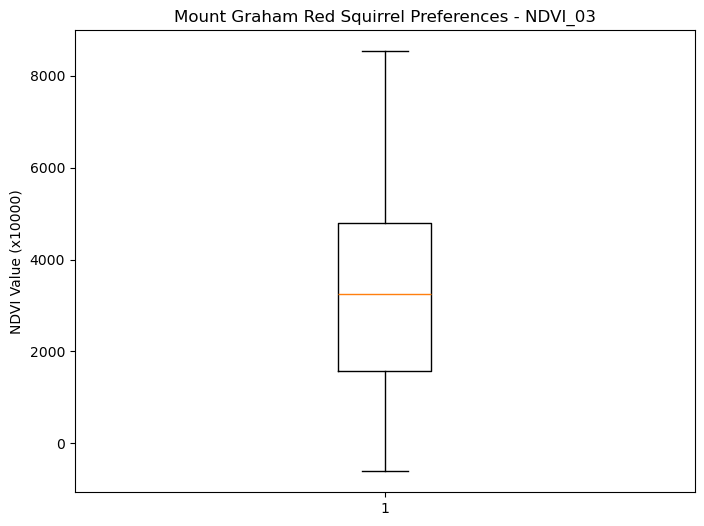

Mean: 3164.3513725490197
Standard deviation: 1849.1300900534843



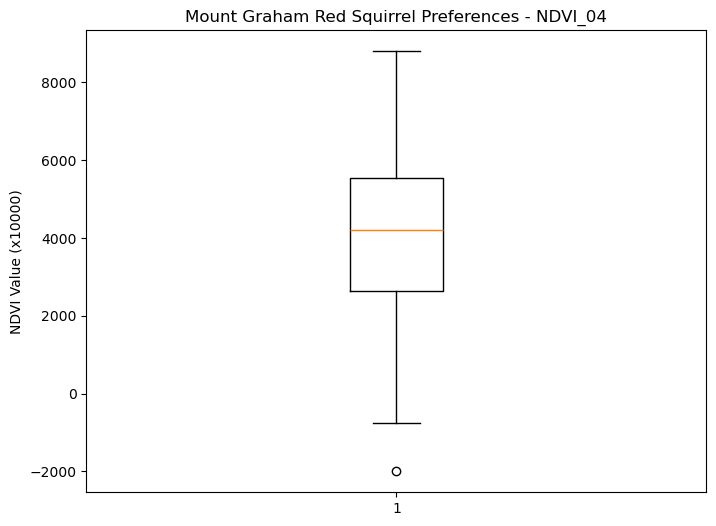

Mean: 4016.3443137254903
Standard deviation: 1836.392187620966



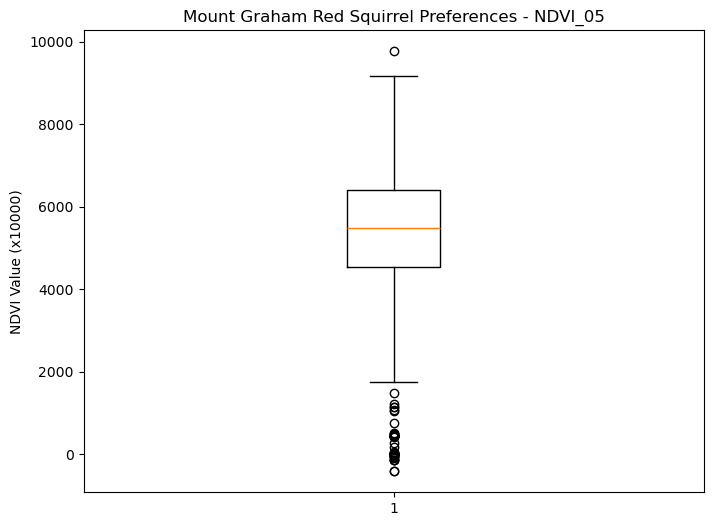

Mean: 5201.792156862745
Standard deviation: 1694.5987568044657



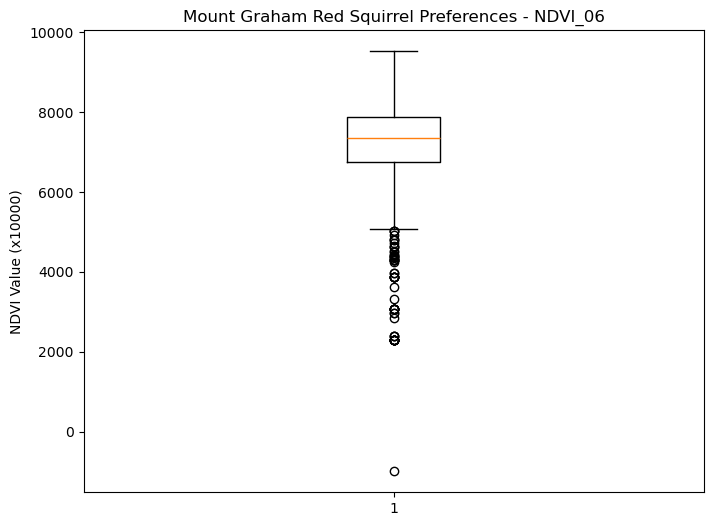

Mean: 7180.042352941176
Standard deviation: 1164.024182759033



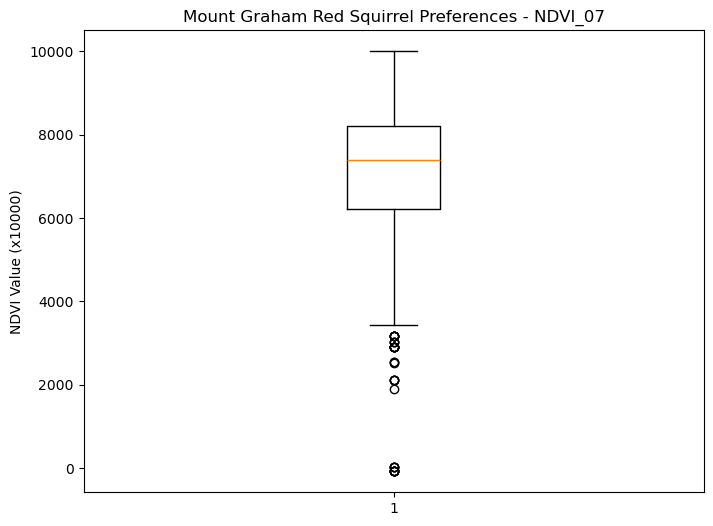

Mean: 7095.881568627451
Standard deviation: 1625.9104675843512



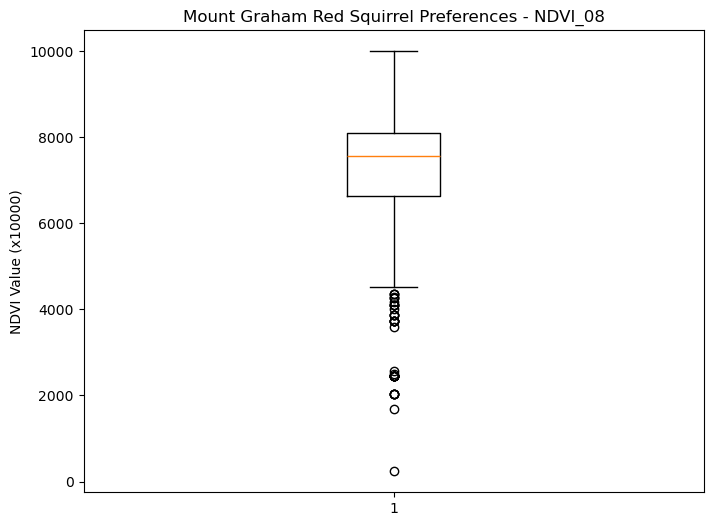

Mean: 7299.832156862745
Standard deviation: 1292.3195628393569



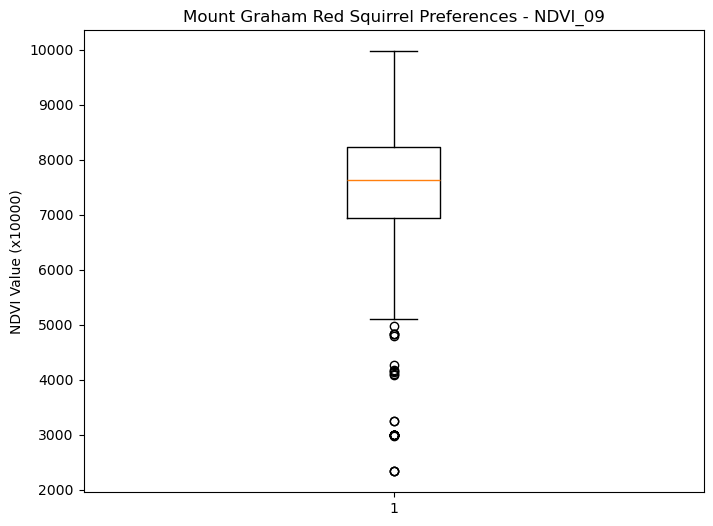

Mean: 7529.026666666667
Standard deviation: 1111.5033588405222



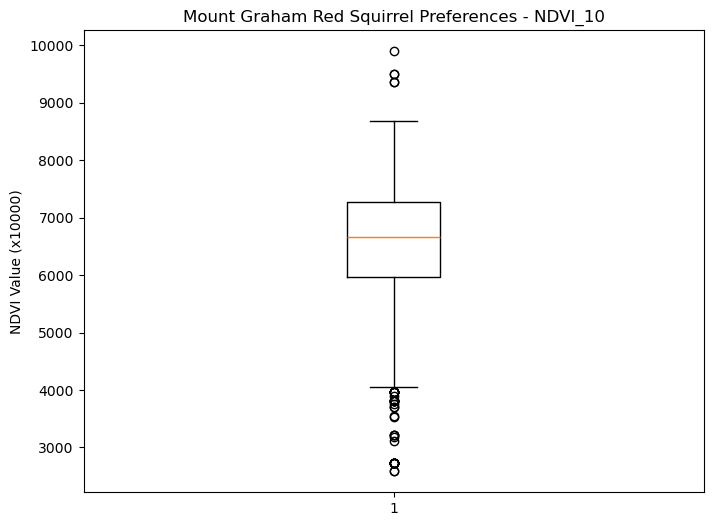

Mean: 6543.013333333333
Standard deviation: 1049.0281571008338



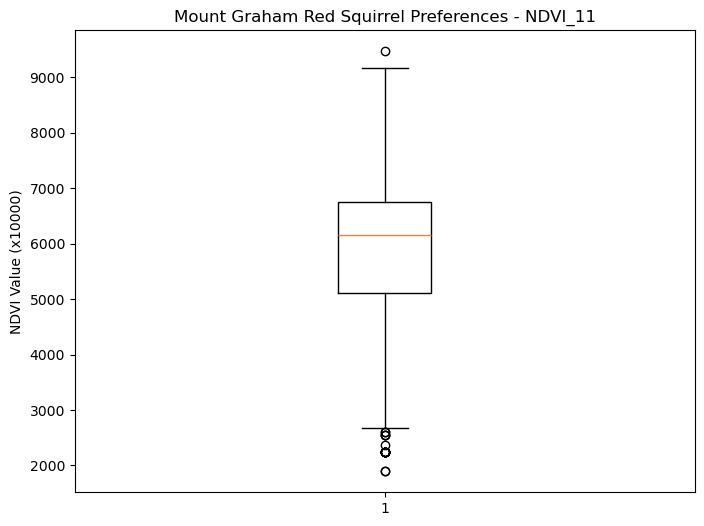

Mean: 5833.710588235294
Standard deviation: 1290.8159553622606



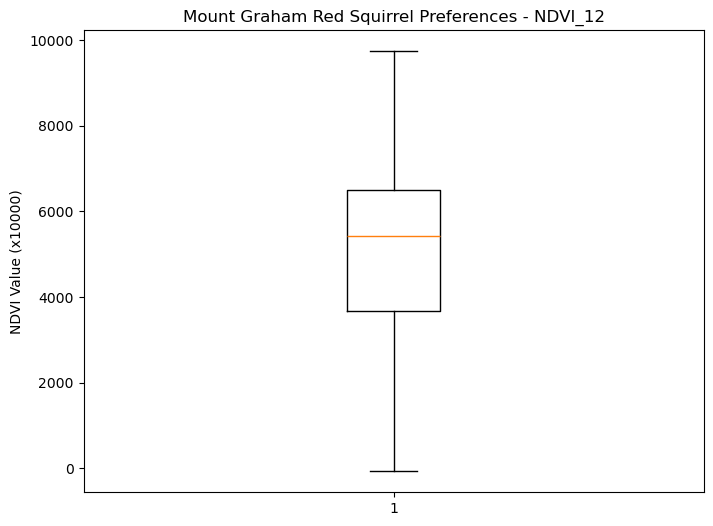

Mean: 5073.480784313725
Standard deviation: 2135.8324628774913



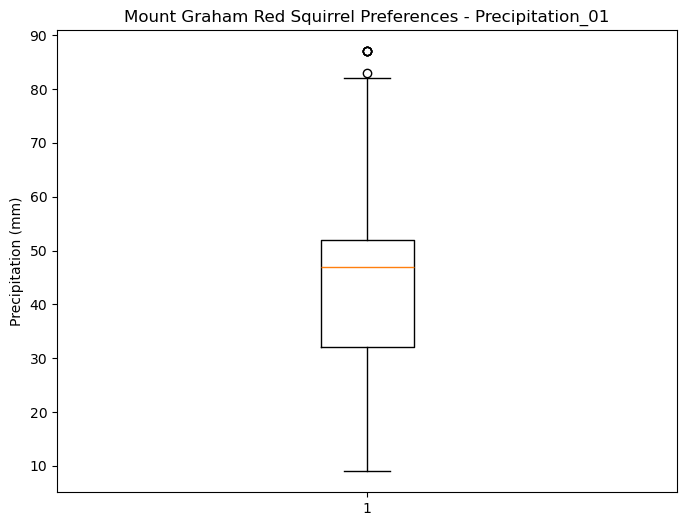

Mean: 44.422745098039215
Standard deviation: 13.134168783473745



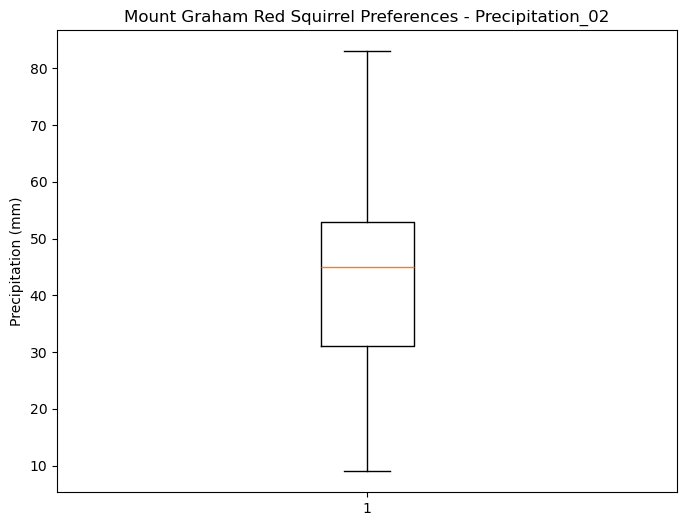

Mean: 43.70196078431373
Standard deviation: 13.4655425448334



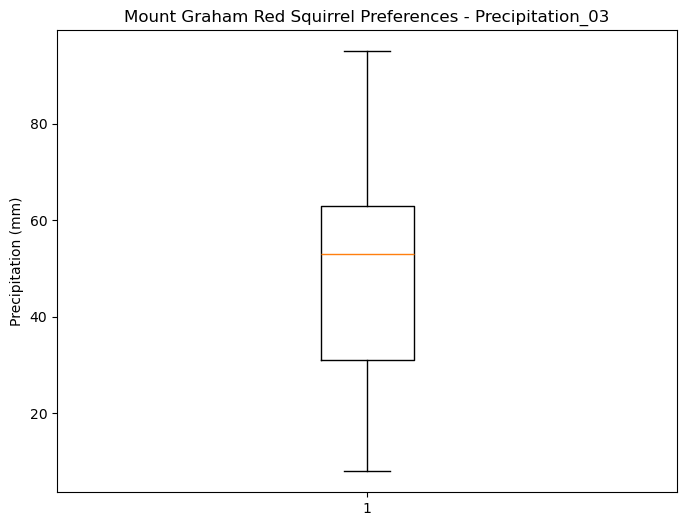

Mean: 49.96
Standard deviation: 18.049969015919867



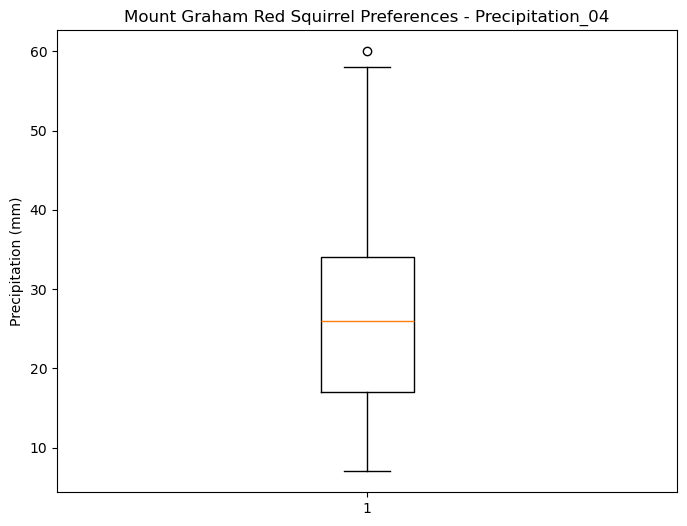

Mean: 27.032941176470587
Standard deviation: 10.630094732745768



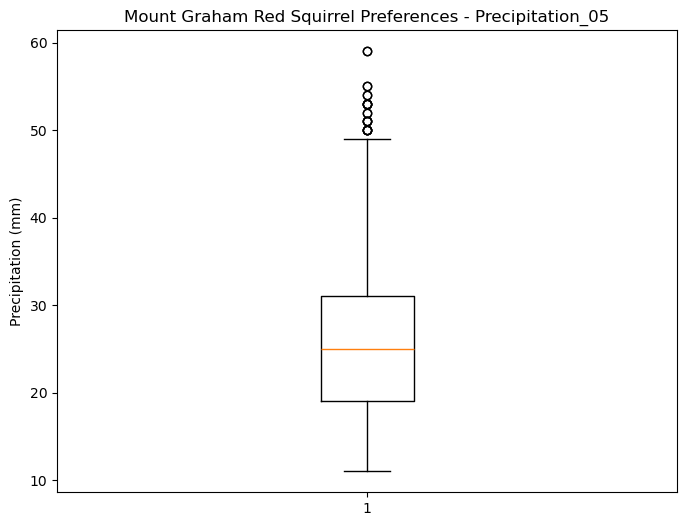

Mean: 26.09098039215686
Standard deviation: 8.772882001612407



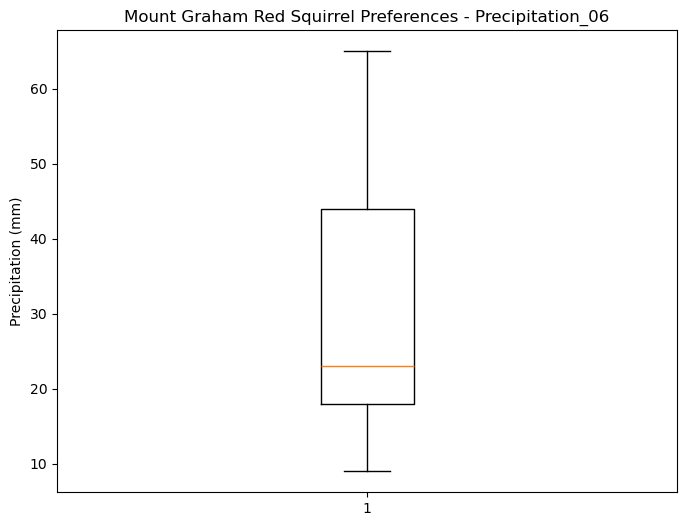

Mean: 29.817254901960784
Standard deviation: 14.149305345213433



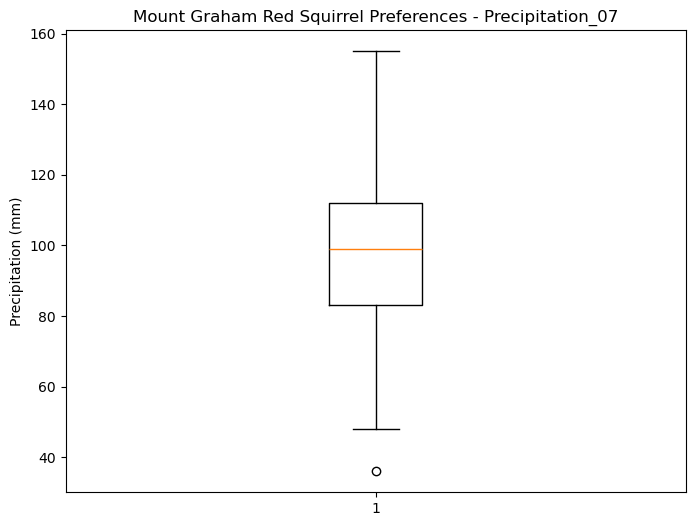

Mean: 95.88392156862746
Standard deviation: 20.541202236451607



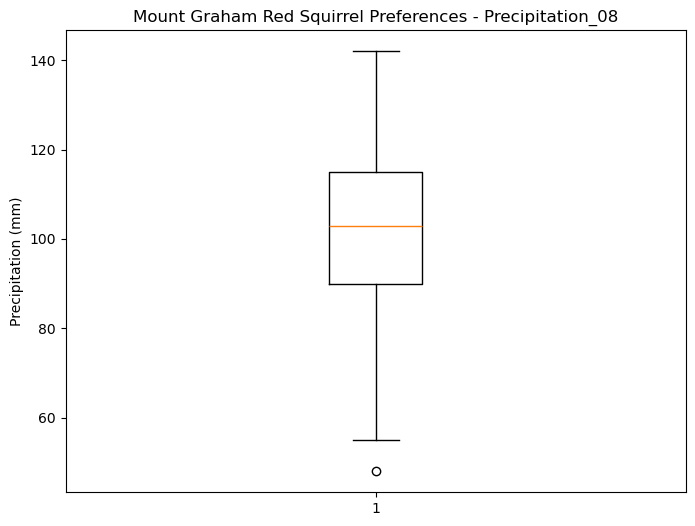

Mean: 101.29882352941176
Standard deviation: 19.04908037919441



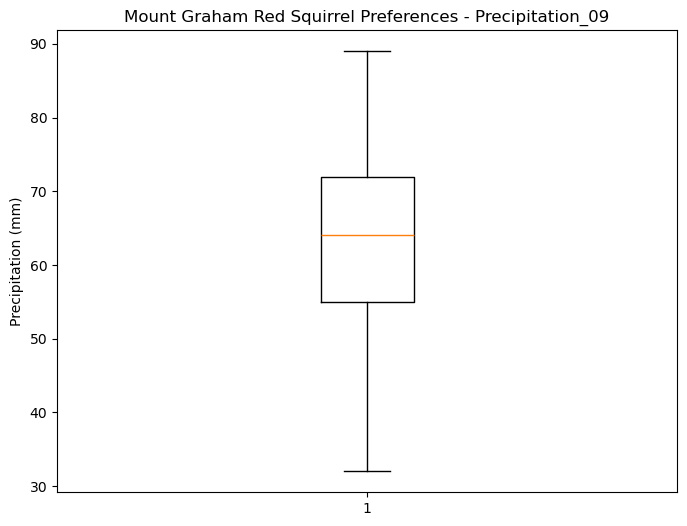

Mean: 63.19294117647059
Standard deviation: 13.022940044488632



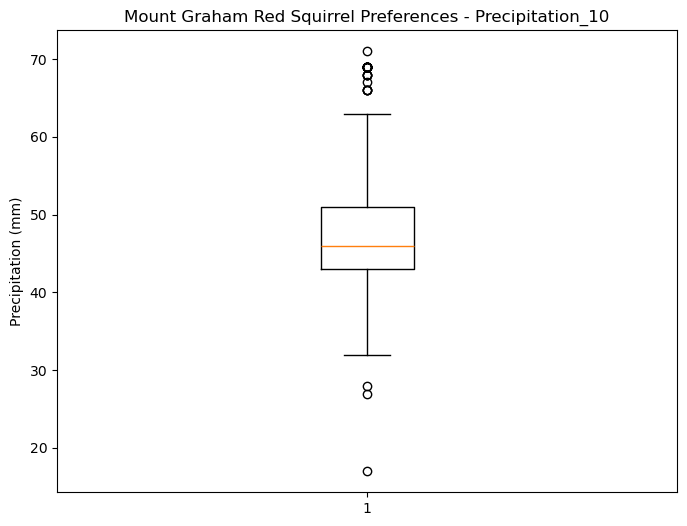

Mean: 47.24862745098039
Standard deviation: 7.1109278174836295



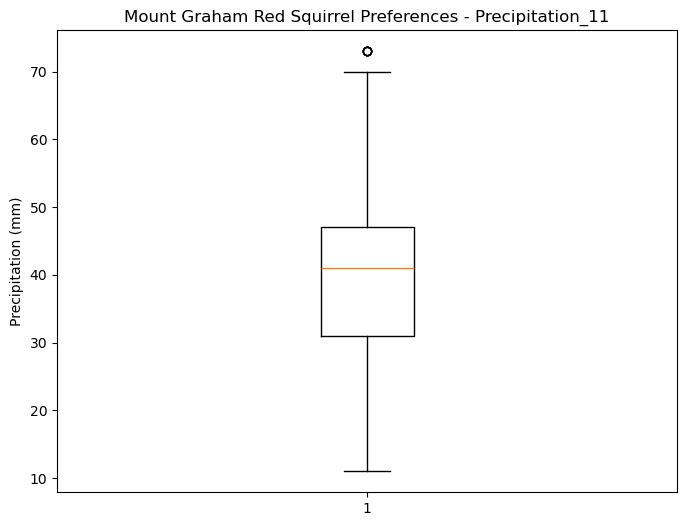

Mean: 40.47686274509804
Standard deviation: 10.332618461872796



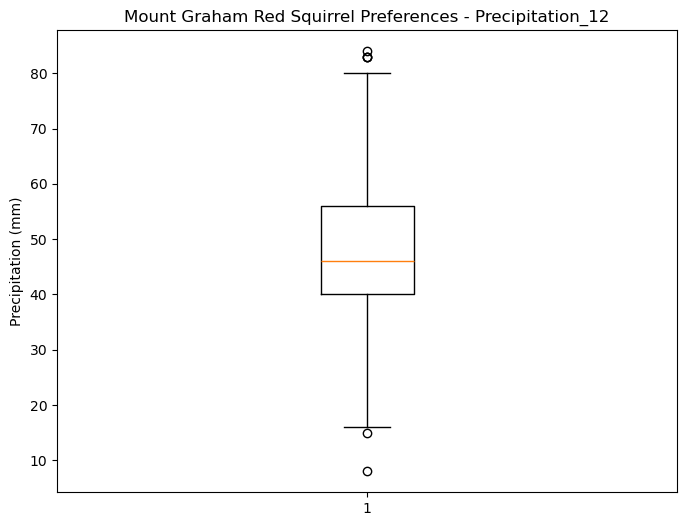

Mean: 47.80627450980392
Standard deviation: 12.197779792700393



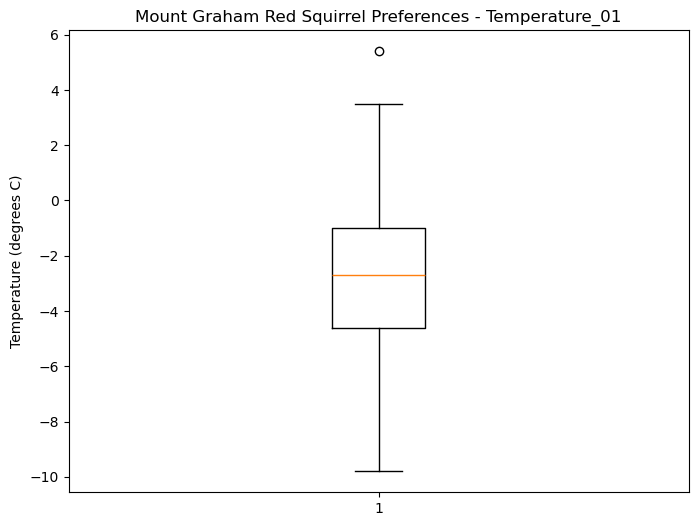

Mean: -2.897803917369422
Standard deviation: 2.2699479897501624



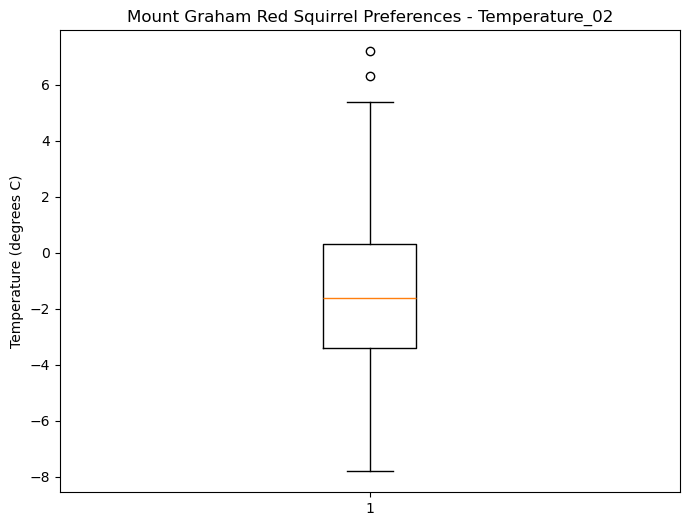

Mean: -1.6158431349373332
Standard deviation: 2.393443421578655



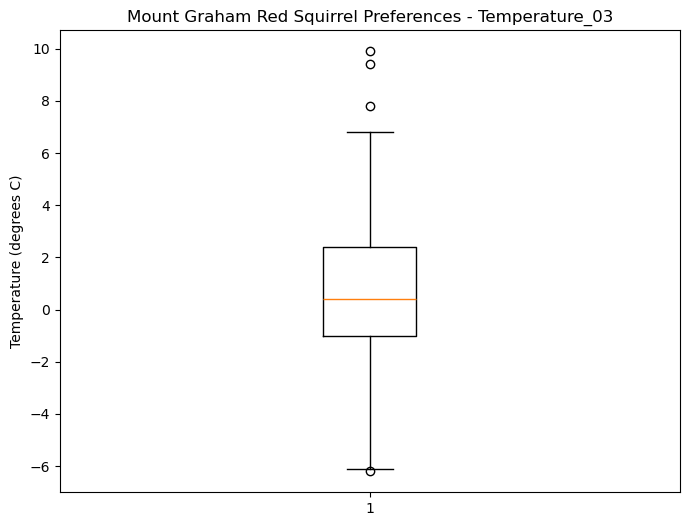

Mean: 0.48149020155270894
Standard deviation: 2.477440300793035



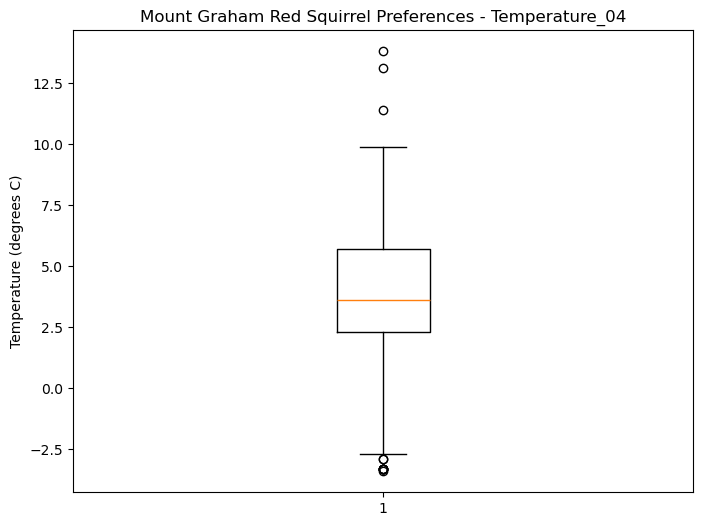

Mean: 3.8028235424324577
Standard deviation: 2.6390275115432167



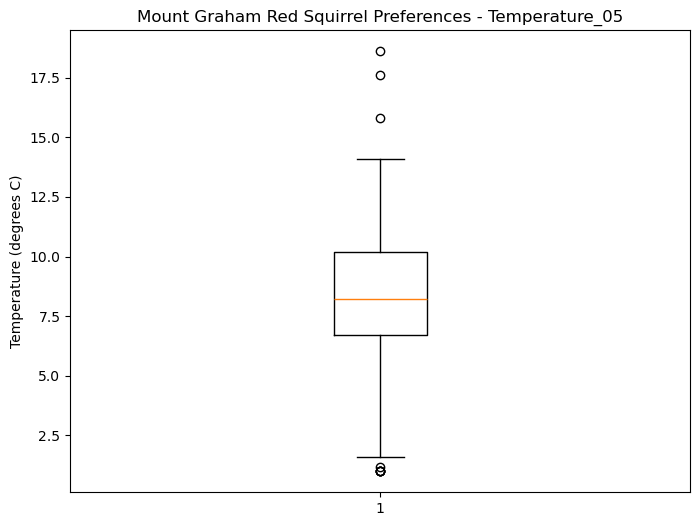

Mean: 8.213333338849685
Standard deviation: 2.5341302137429187



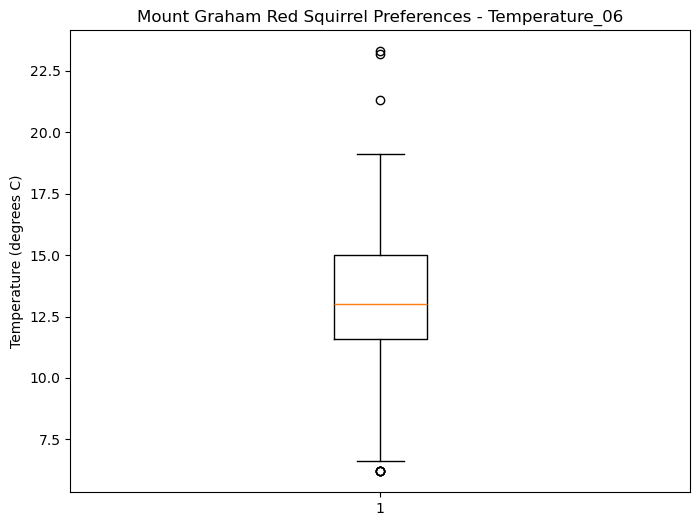

Mean: 13.11427453807756
Standard deviation: 2.4425101023205693



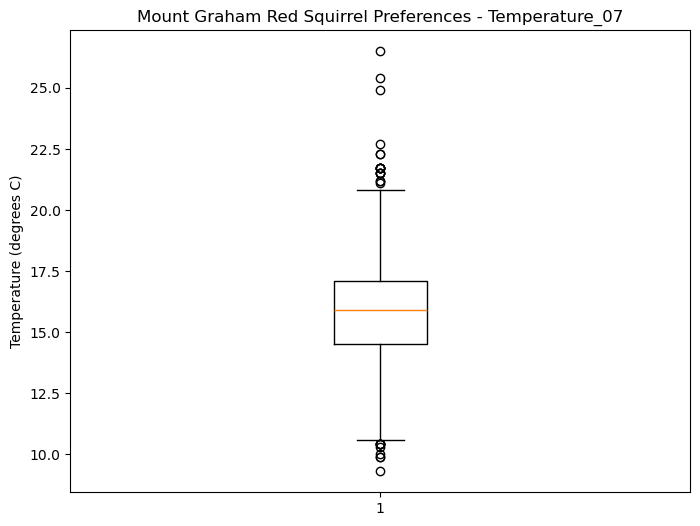

Mean: 15.736235318651387
Standard deviation: 2.020220833789501



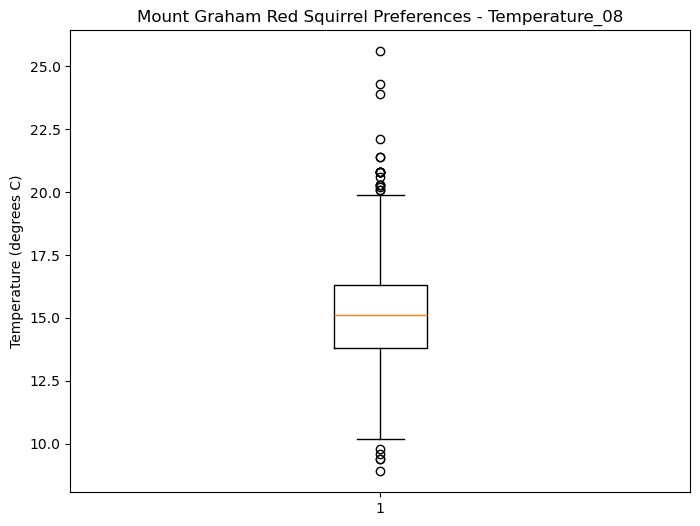

Mean: 15.013725453545065
Standard deviation: 1.9376606467725928



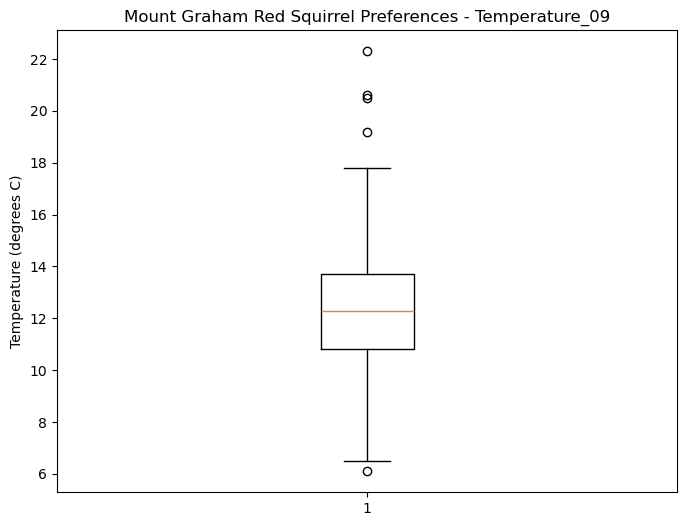

Mean: 12.200392155740776
Standard deviation: 1.9496265472425862



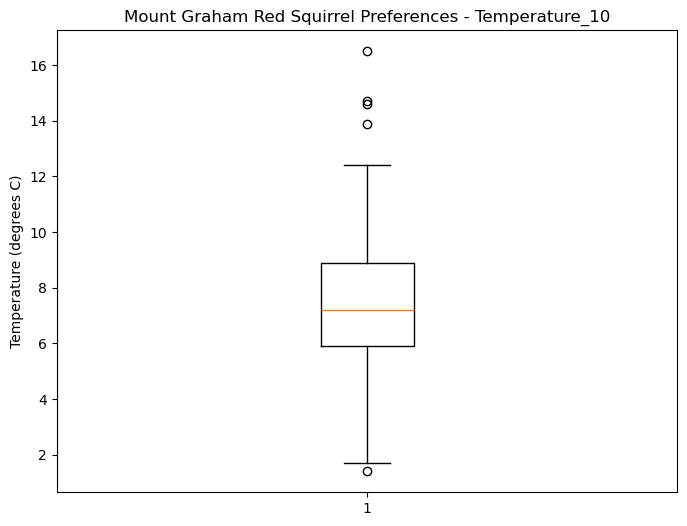

Mean: 7.270274528335123
Standard deviation: 1.9218693987008002



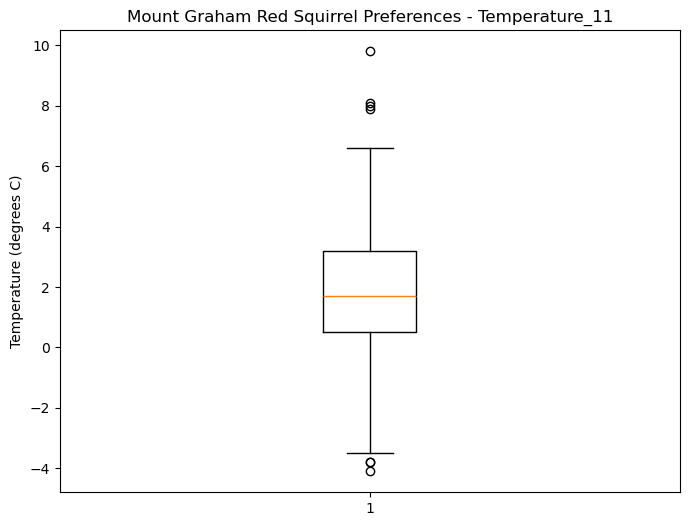

Mean: 1.609254897382914
Standard deviation: 1.8987996667773603



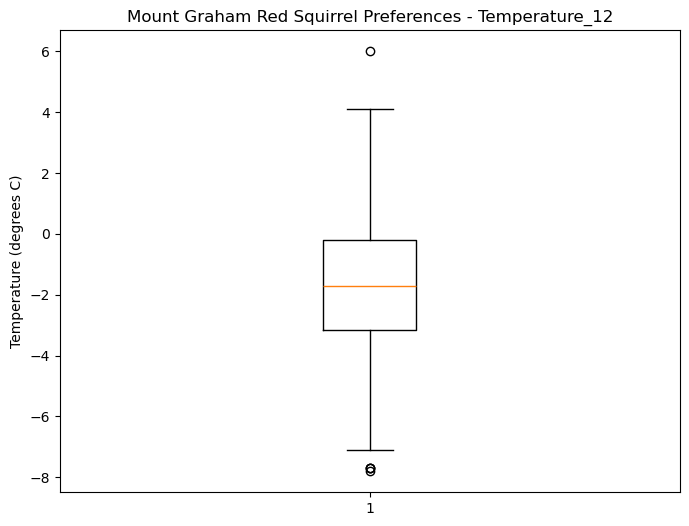

Mean: -1.788392159255112
Standard deviation: 2.01923020000565



In [18]:
red_squirrel_listDict = findPrefs(red_squirrel,rastList,'Mount Graham Red Squirrel')

## Create a dictionary of the preferences

In [19]:
# Create empty precipitation and temperature list
precList = []
tempList = []
ndviList = []

# Create a nested list of all of the monthly precipitation and temperature rasters
for key in red_squirrel_listDict:

    # If the raster is illustrating precipitation
    if 'Precipitation' in key:

        # Add the list to the precList
        precList.append(red_squirrel_listDict[str(key)])

    # If the raster is illustrating temperature
    elif 'Temperature' in key:

        # Add the list to the tempList
        tempList.append(red_squirrel_listDict[str(key)])

    # Else (NDVI raster)
    elif 'NDVI' in key:

        # Add the list to the tempList
        ndviList.append(red_squirrel_listDict[str(key)])

## Create Histograms

In [20]:
# Define a function to create histograms
def createHistogram(data,xmin,xmax,ymin,ymax,figsize,x_title,histogram_title,title_fontsize,out_folder):

    # Set the figure size
    plt.figure(figsize=figsize)
    
    # Create histogram for the data itself
    plt.hist(data, bins=20, range=(xmin,xmax), edgecolor='black', alpha=0.5)

    # Plot the histogram
    plt.title(histogram_title, fontsize=title_fontsize)
    plt.xlabel(x_title)
    plt.ylabel('Frequency')

    # Adjust the frequency (y-axis) range
    plt.ylim(ymin, ymax)

    # Save the histogram
    plt.savefig(os.path.join(out_folder,f'{histogram_title}.png'), dpi=300, bbox_inches='tight')
        
    # Show the plot
    plt.show()

    # Print where the figure is saved
    print(f'Figure saved here: {os.path.join(out_folder,f'{histogram_title}.png')}')
    print('')

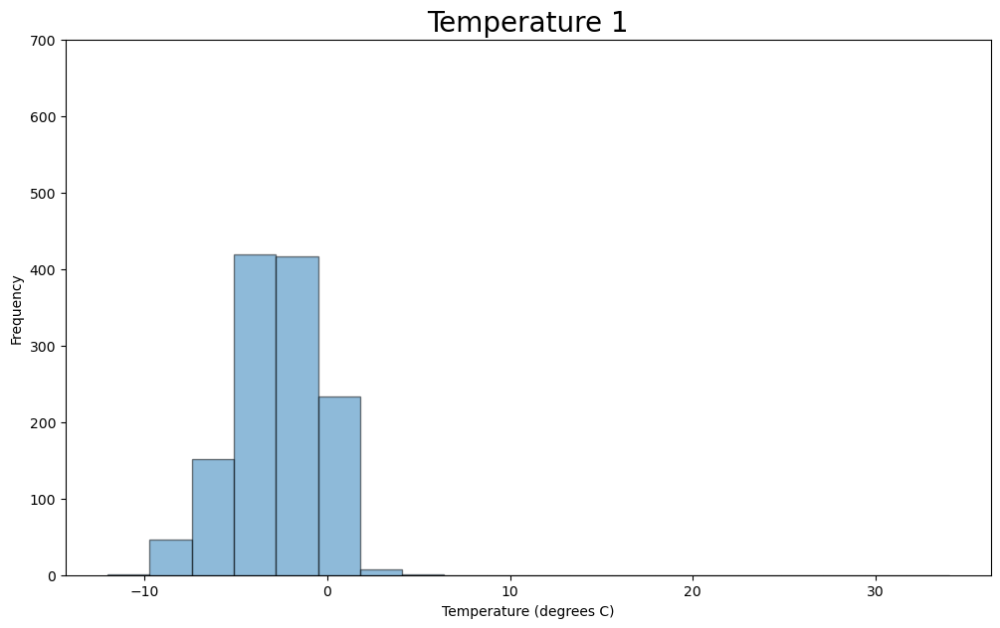

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 1.png



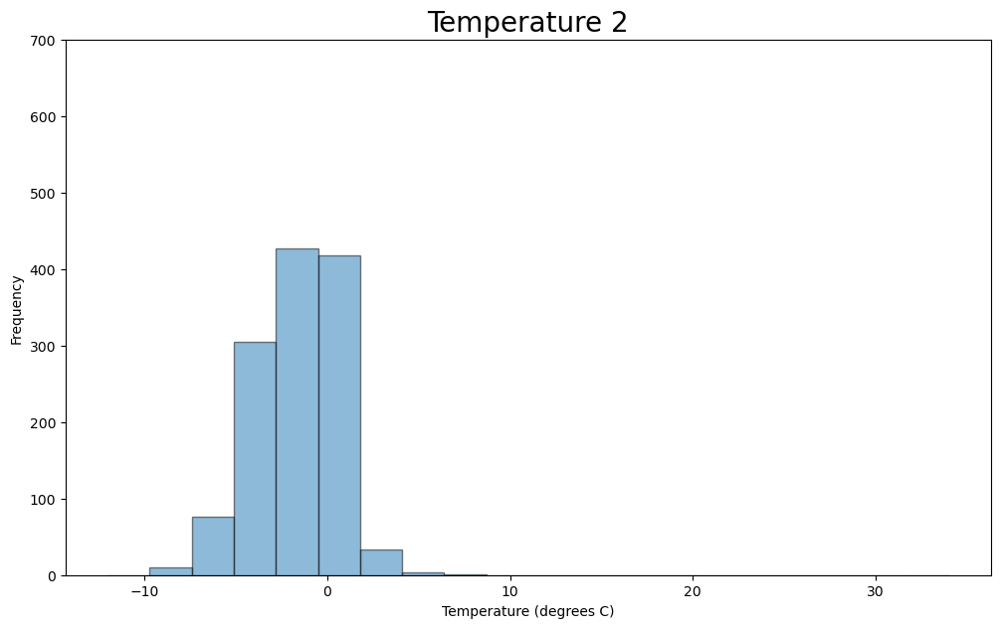

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 2.png



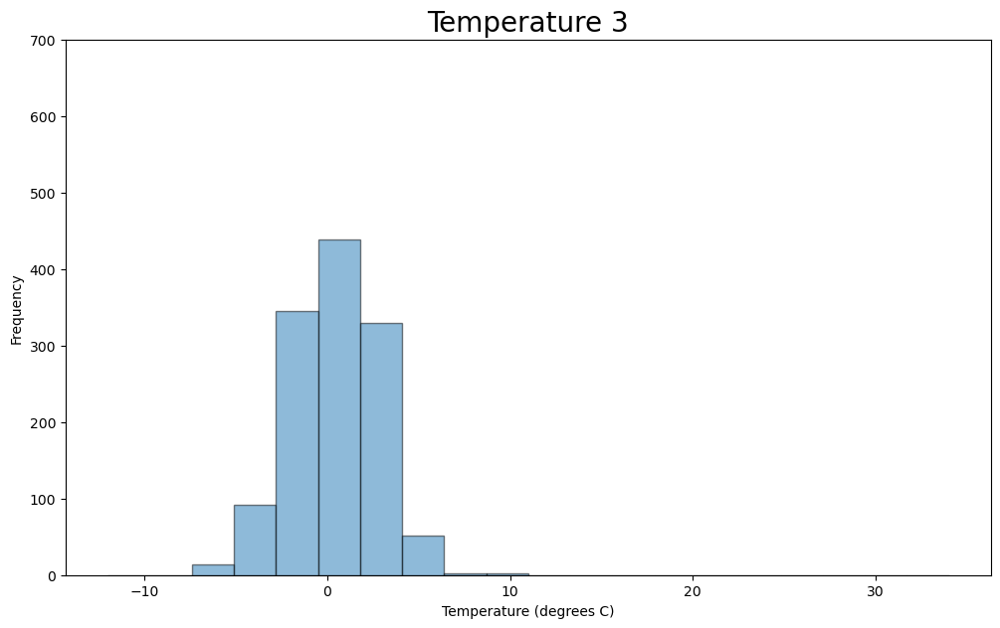

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 3.png



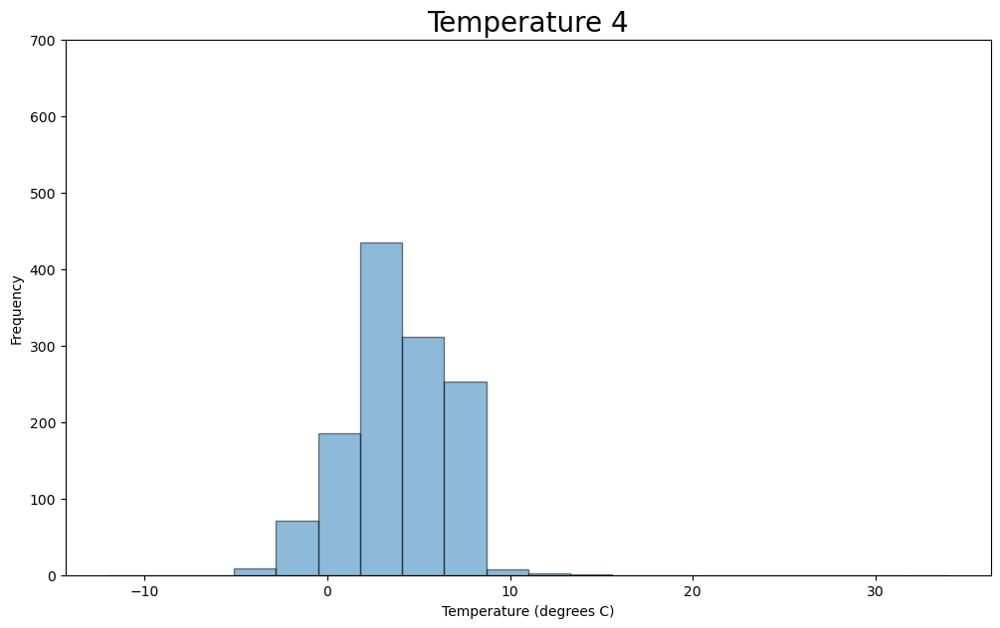

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 4.png



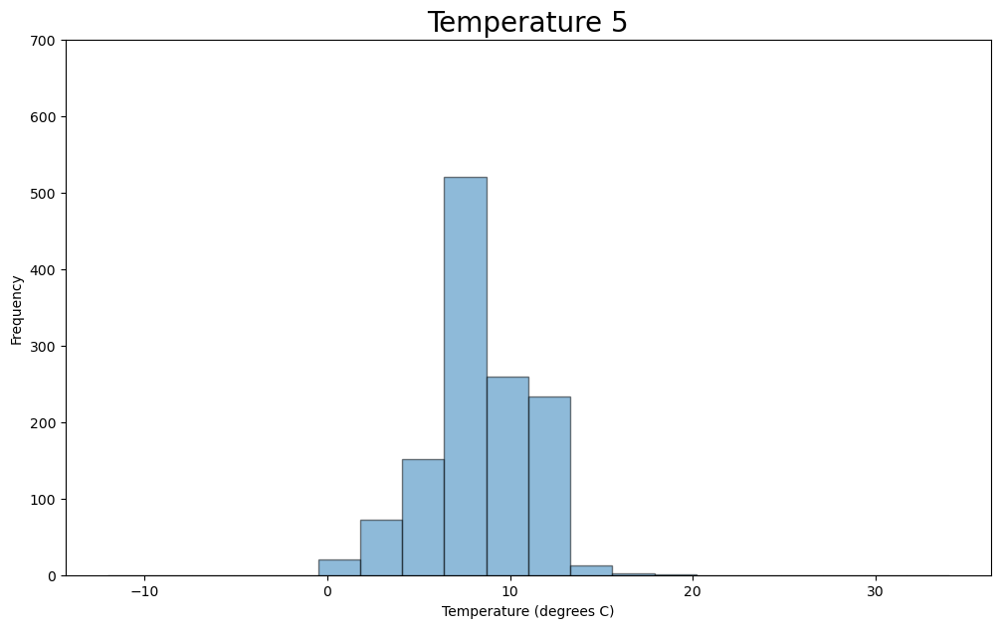

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 5.png



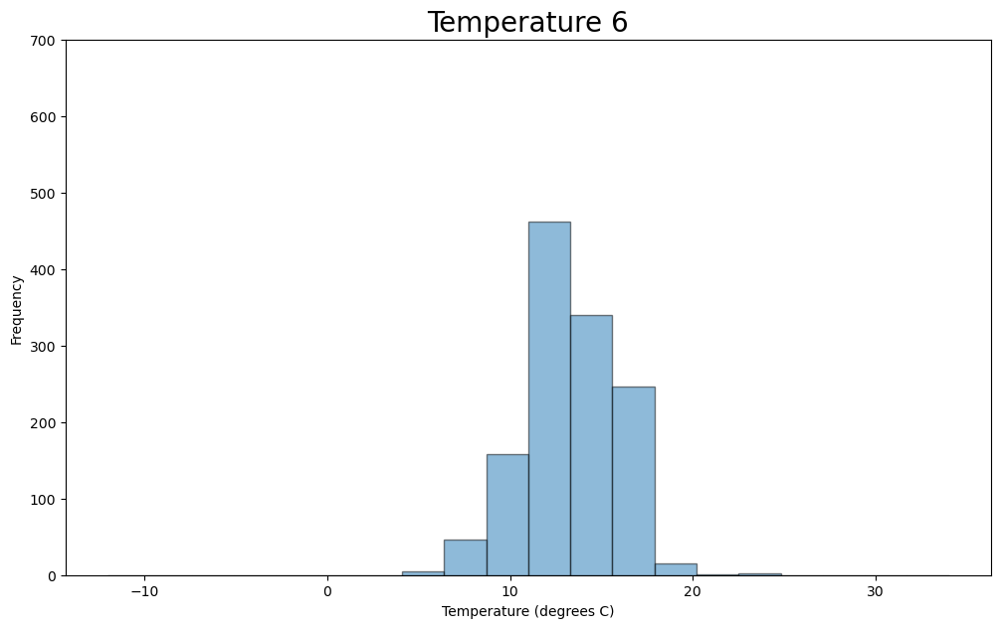

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 6.png



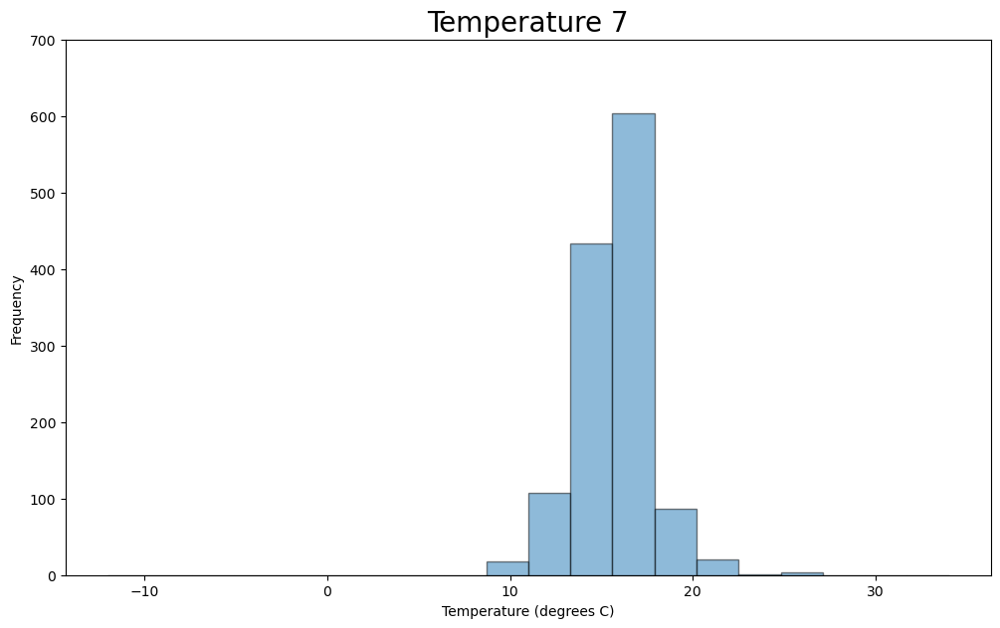

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 7.png



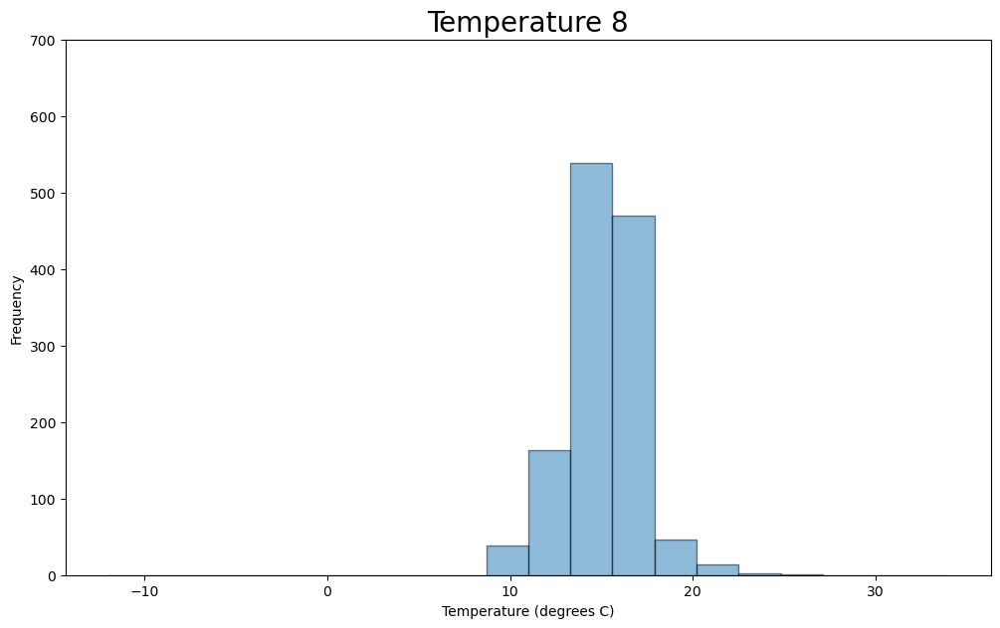

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 8.png



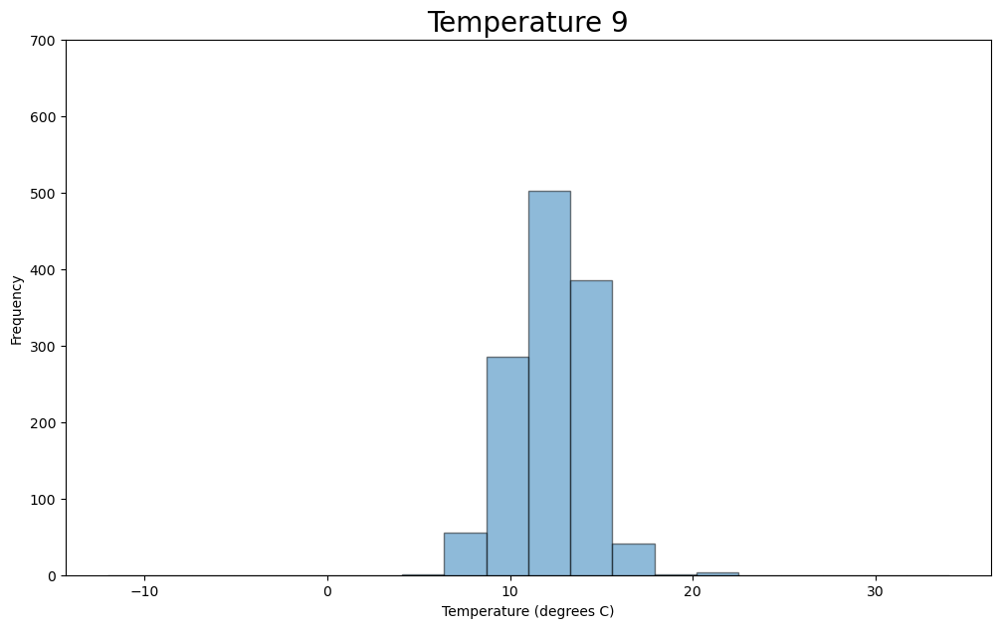

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 9.png



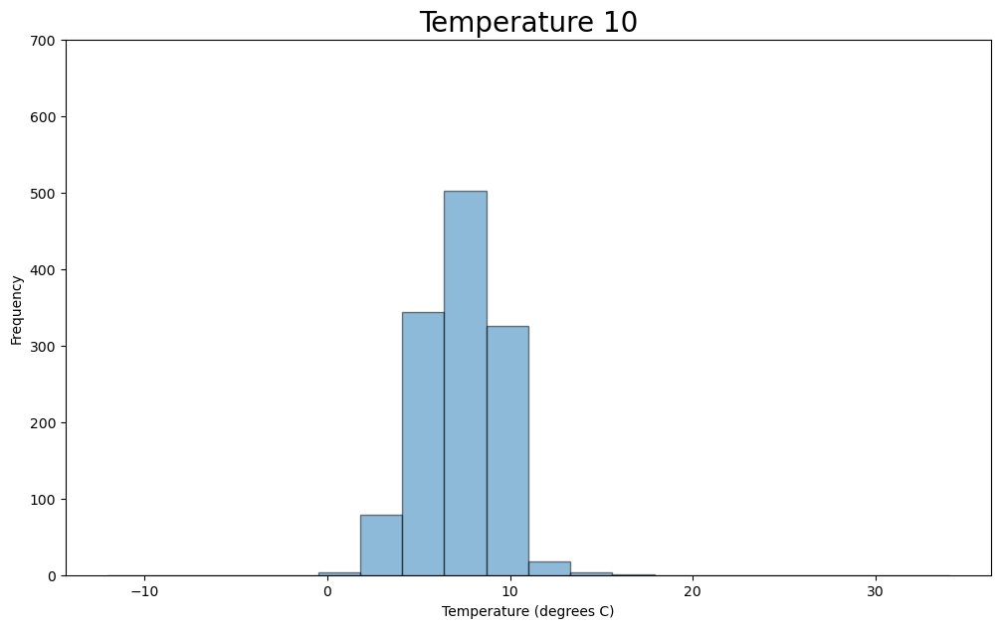

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 10.png



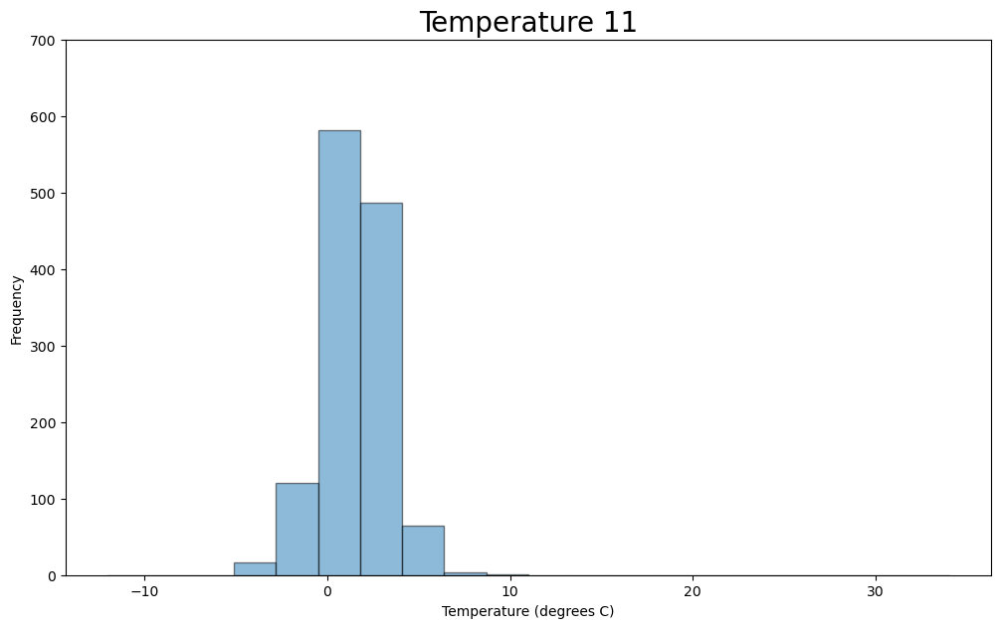

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 11.png



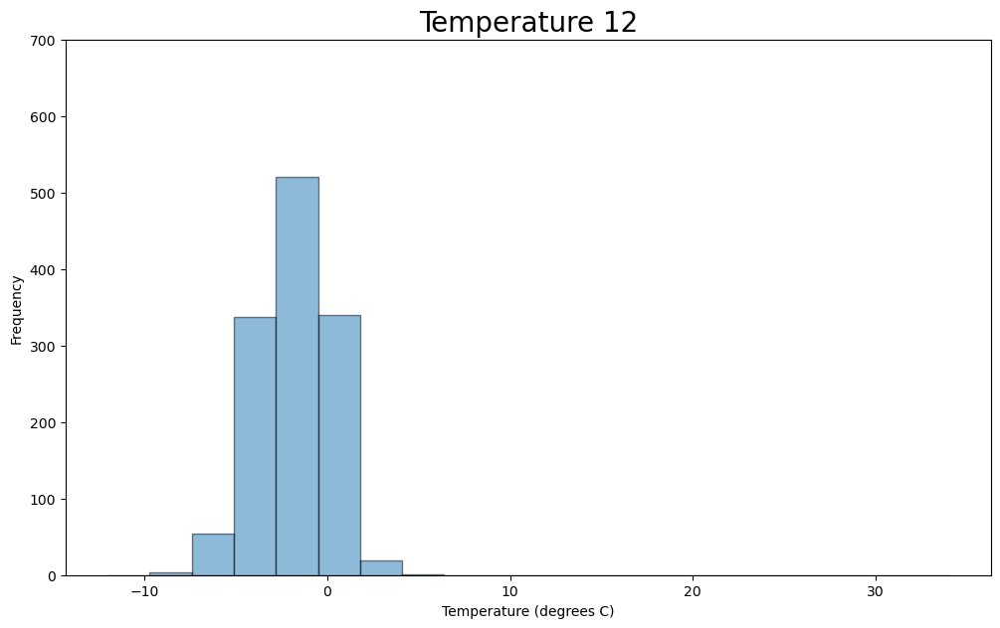

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Temperature 12.png



In [66]:
# Create temperature histogram
month = 0
for temp in tempList:
    month += 1
    createHistogram(
        data = temp, 
        xmin = -12, 
        xmax = 34, 
        ymin = 0,
        ymax = 700,
        figsize = (12,7),
        x_title = 'Temperature (degrees C)', 
        histogram_title = f'Temperature {month}',
        title_fontsize = 20,
        out_folder = r'C:\Users\ericg\IBM_SI\Histograms')

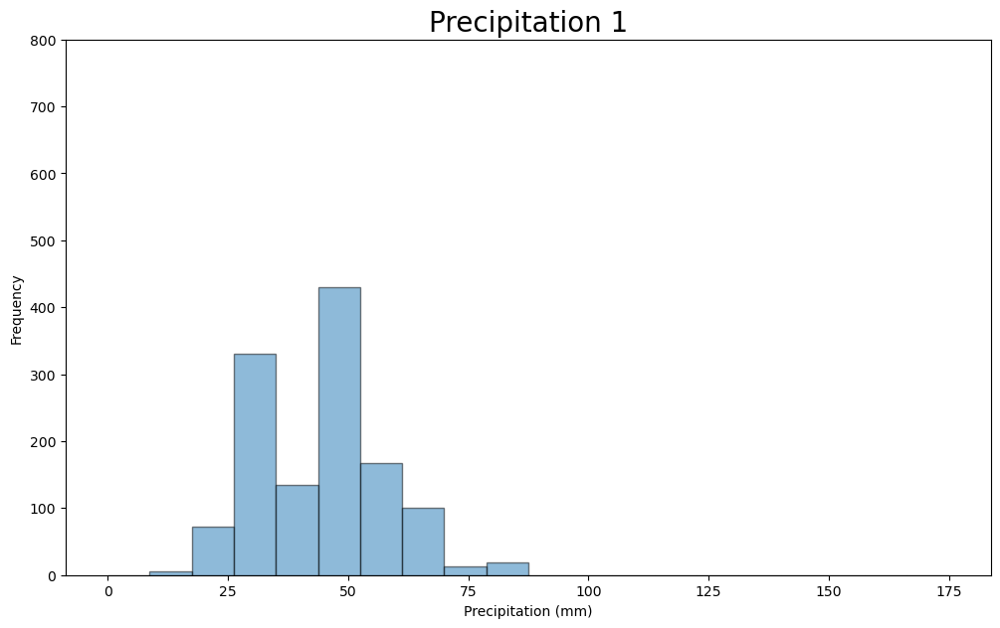

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 1.png



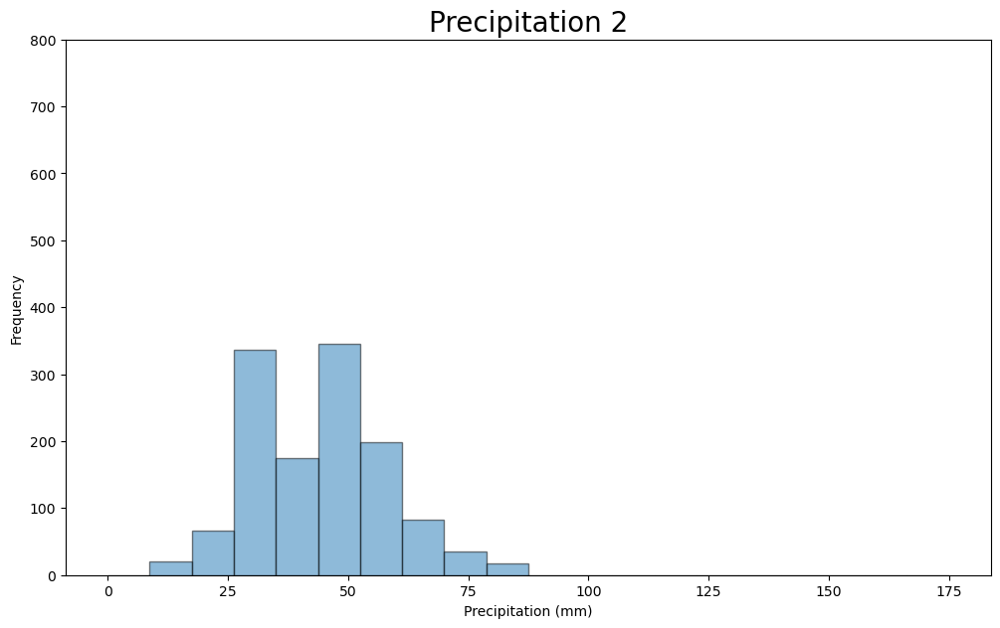

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 2.png



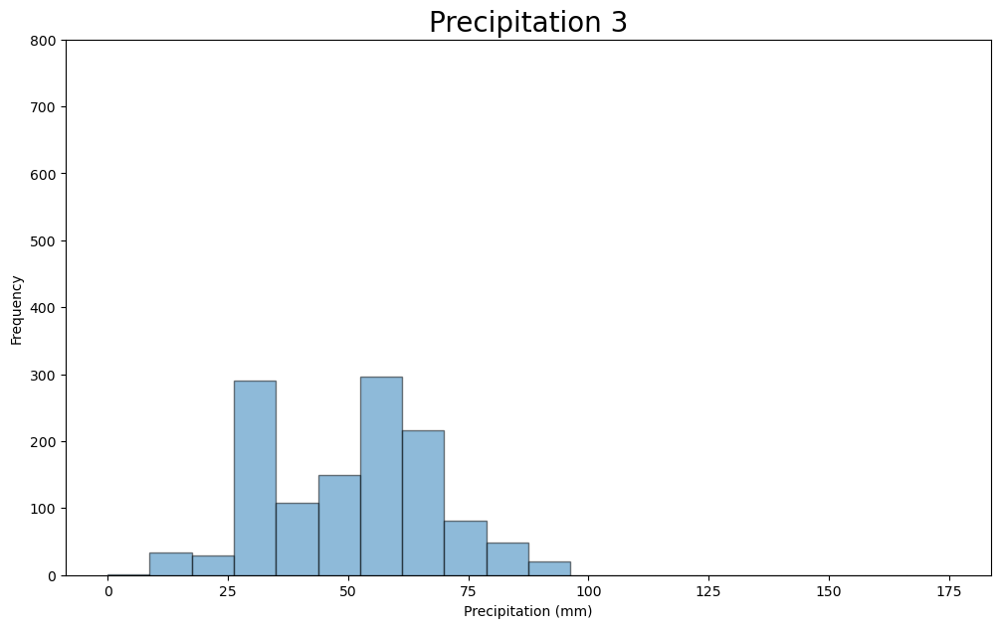

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 3.png



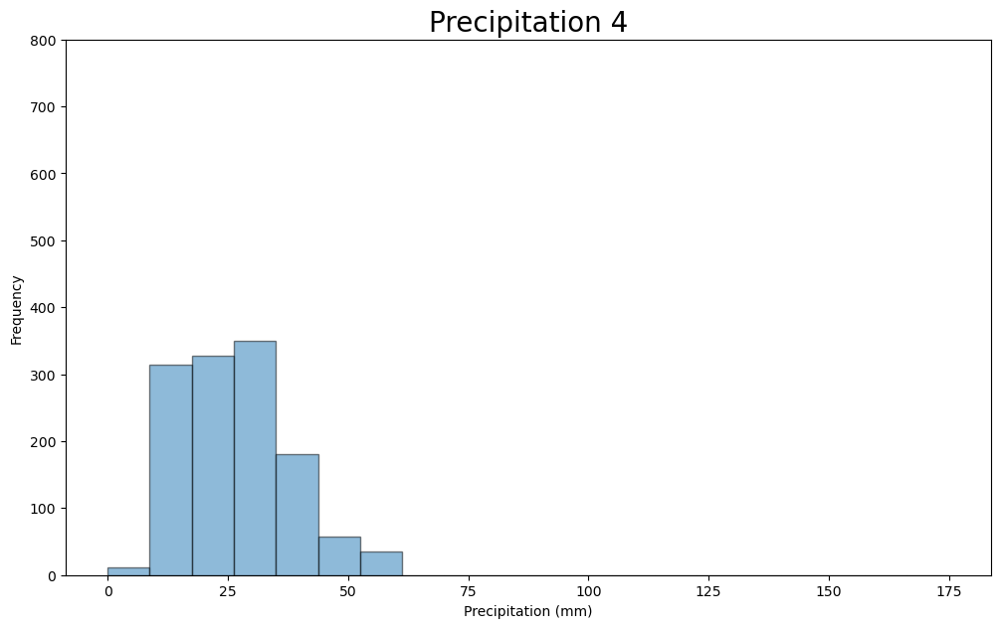

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 4.png



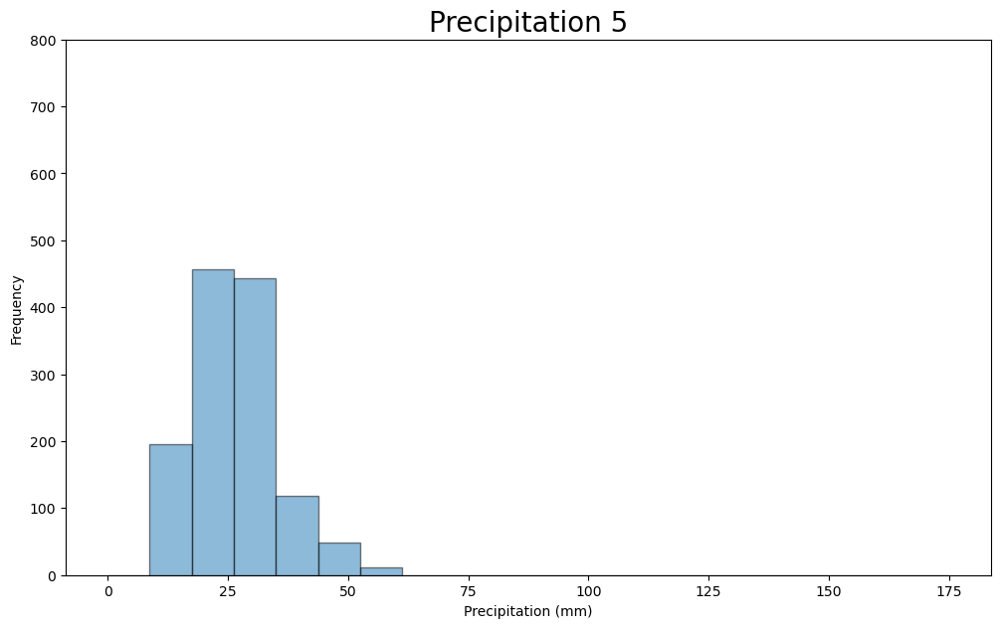

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 5.png



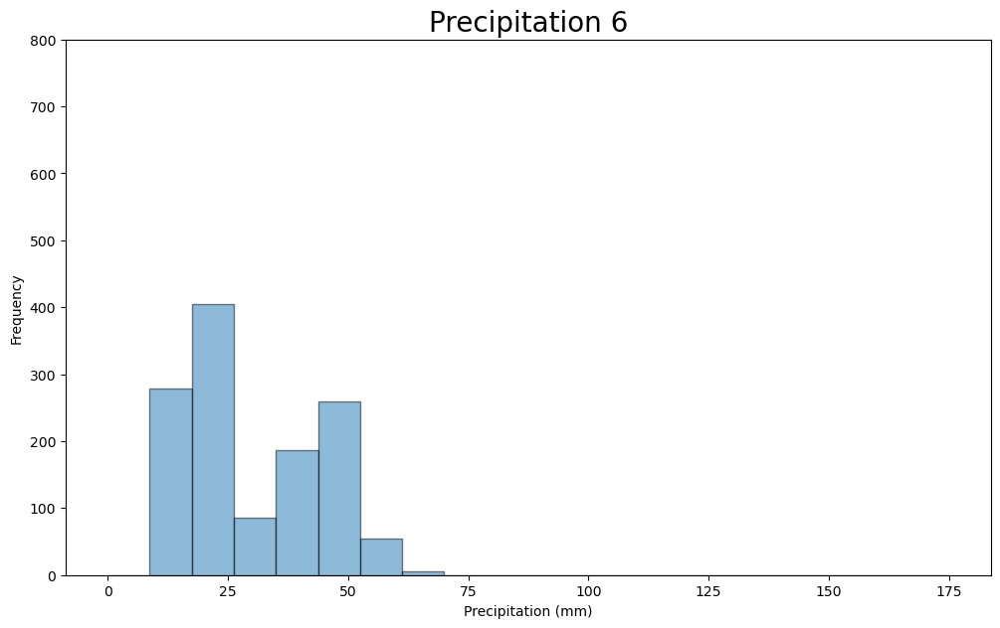

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 6.png



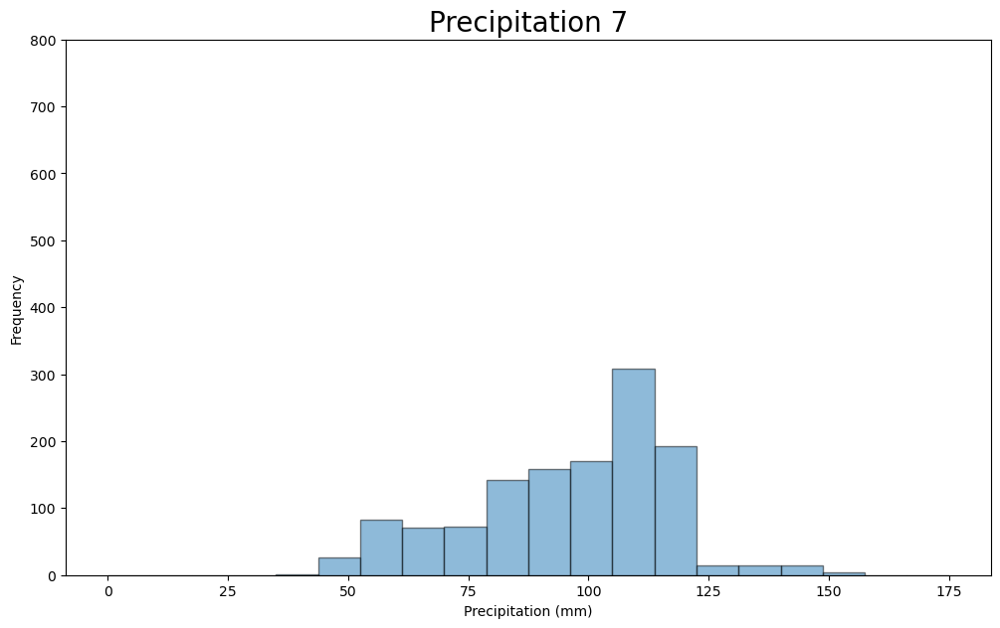

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 7.png



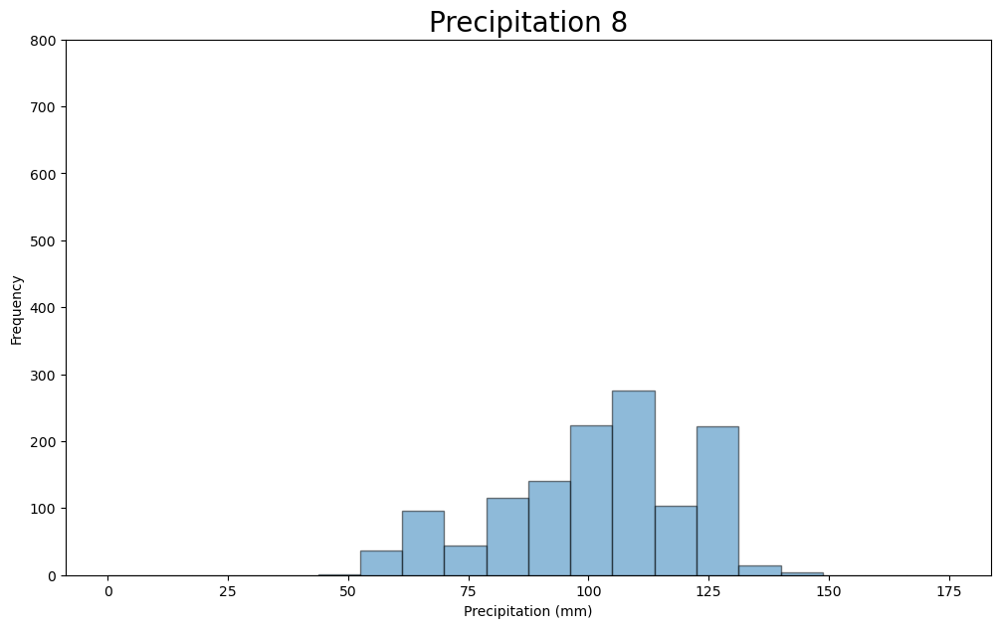

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 8.png



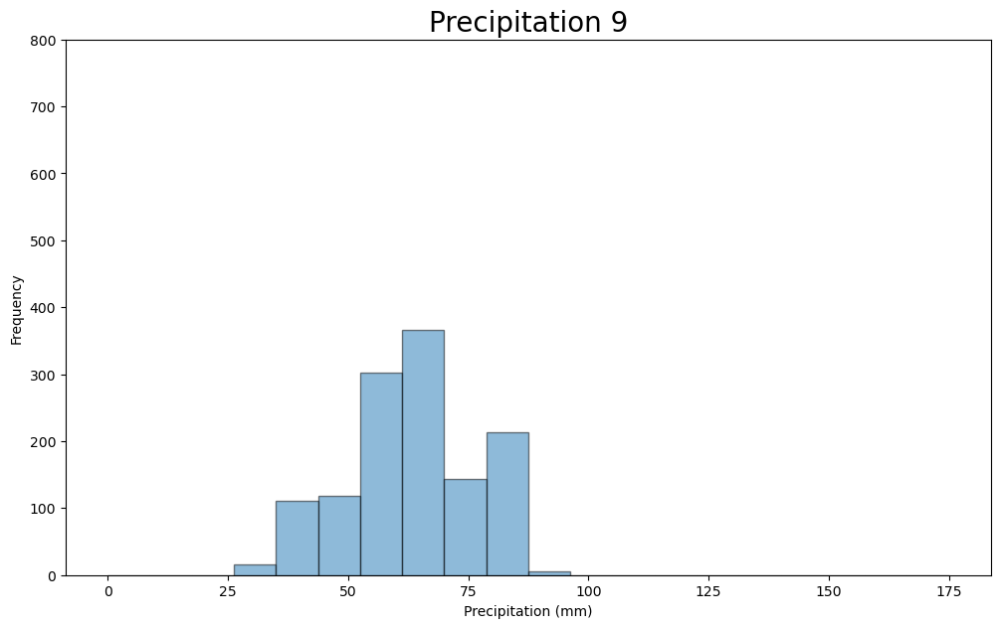

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 9.png



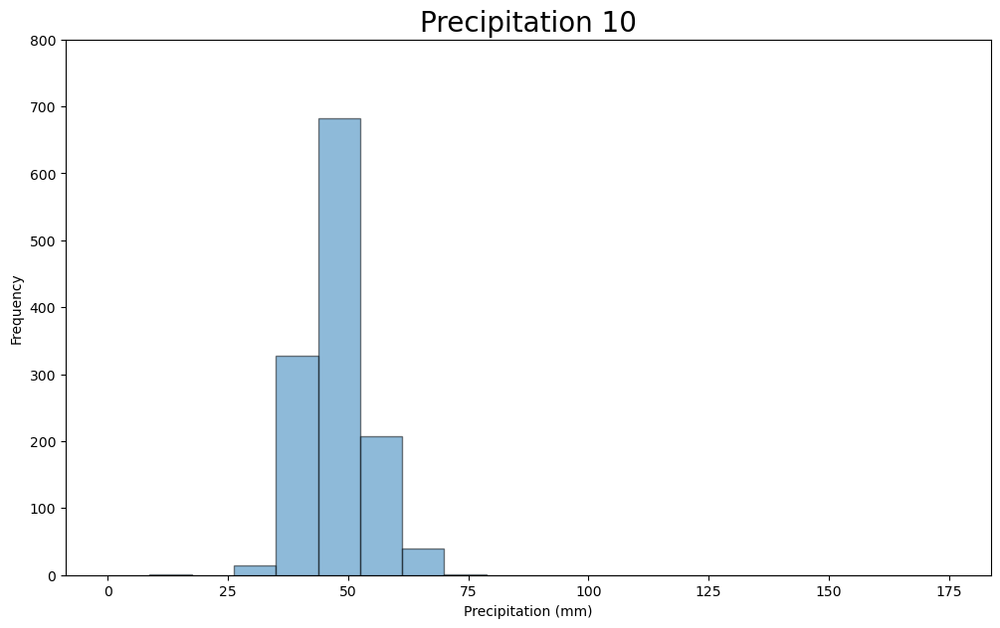

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 10.png



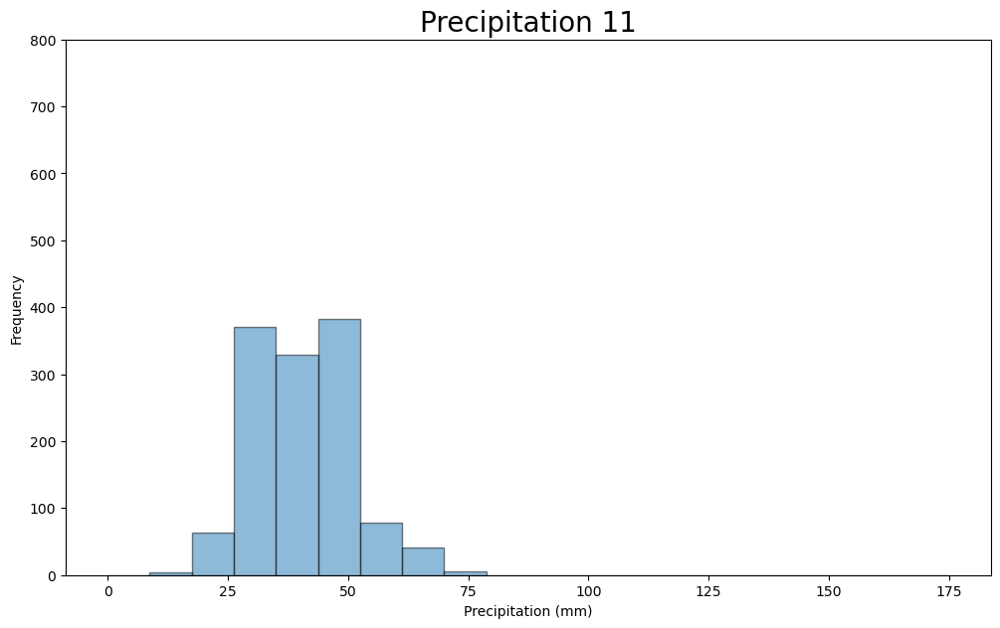

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 11.png



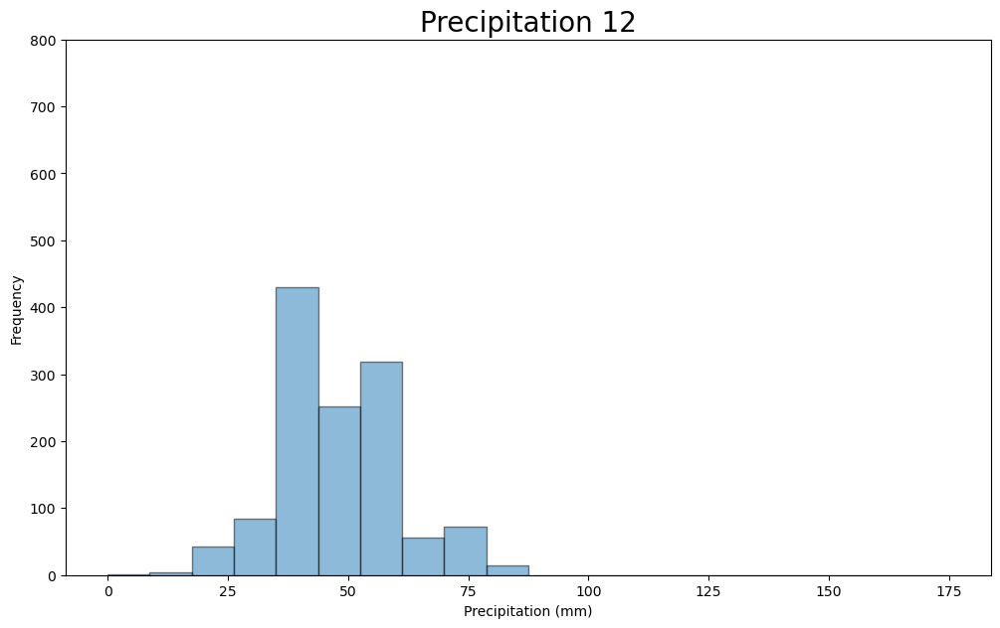

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\Precipitation 12.png



In [67]:
# Create precipitation histogram
month = 0
for prec in precList:
    month += 1
    createHistogram(
        data = prec, 
        xmin = 0, 
        xmax = 175, 
        ymin = 0,
        ymax = 800,
        figsize = (12,7),
        x_title = 'Precipitation (mm)', 
        histogram_title = f'Precipitation {month}',
        title_fontsize = 20,
        out_folder = r'C:\Users\ericg\IBM_SI\Histograms')

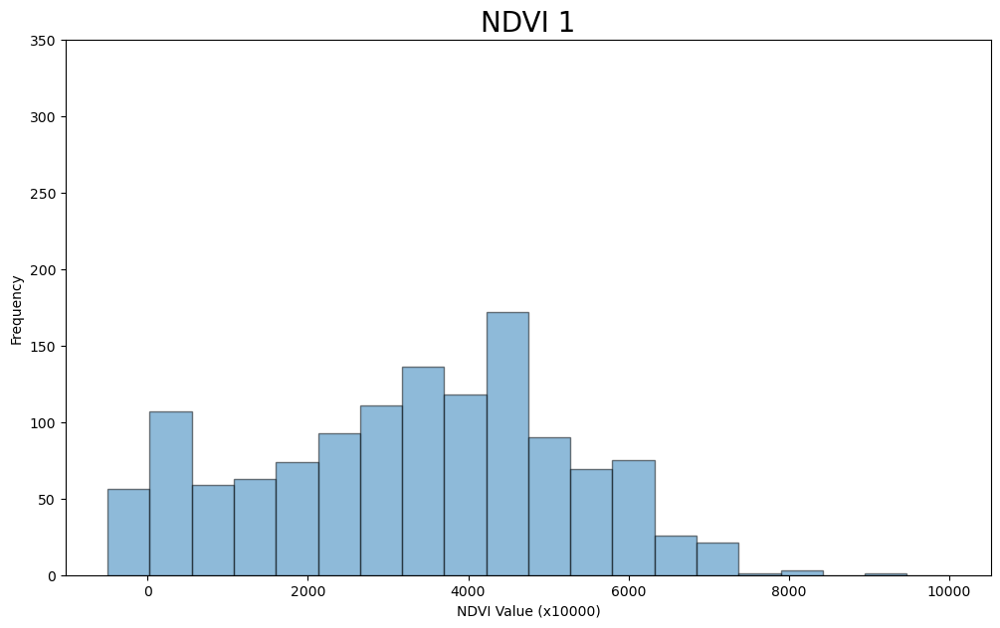

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 1.png



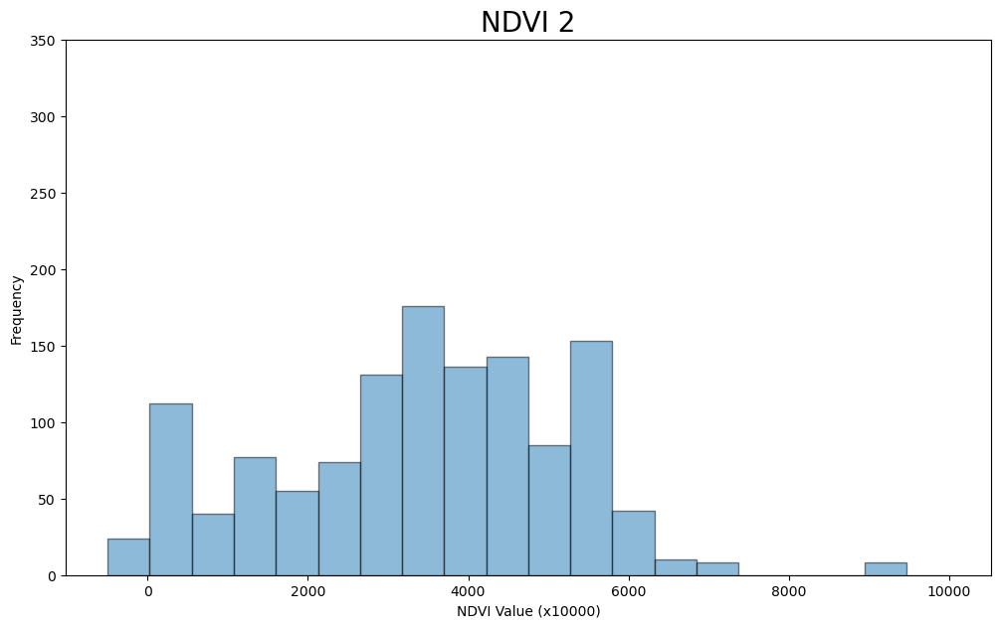

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 2.png



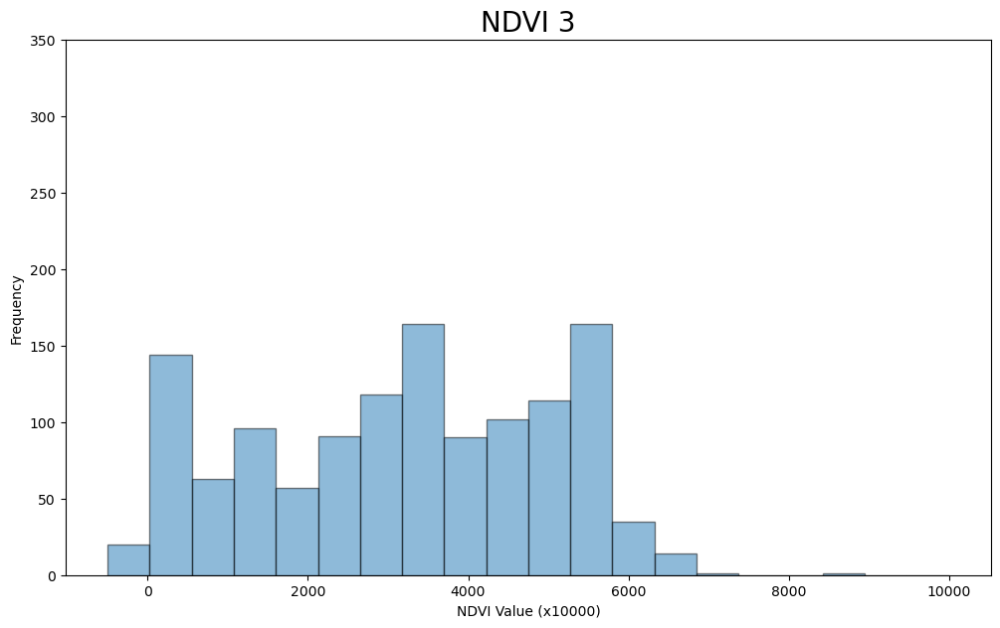

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 3.png



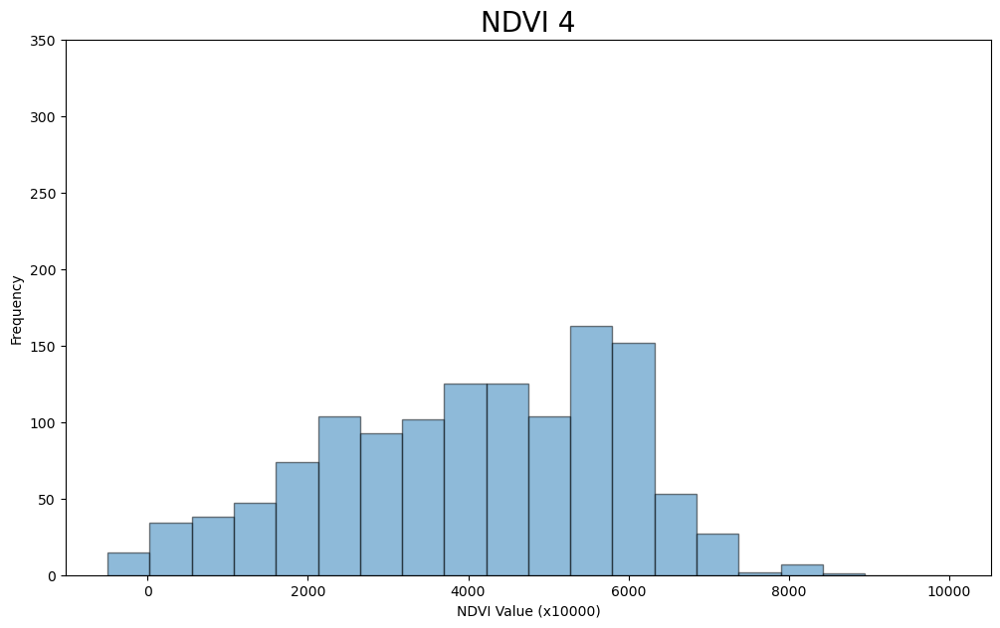

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 4.png



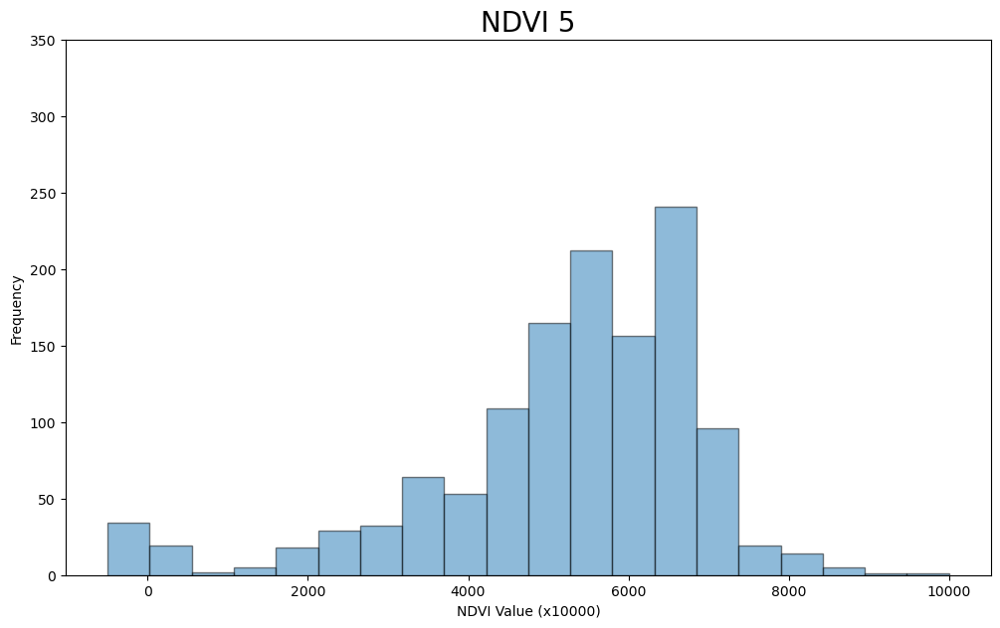

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 5.png



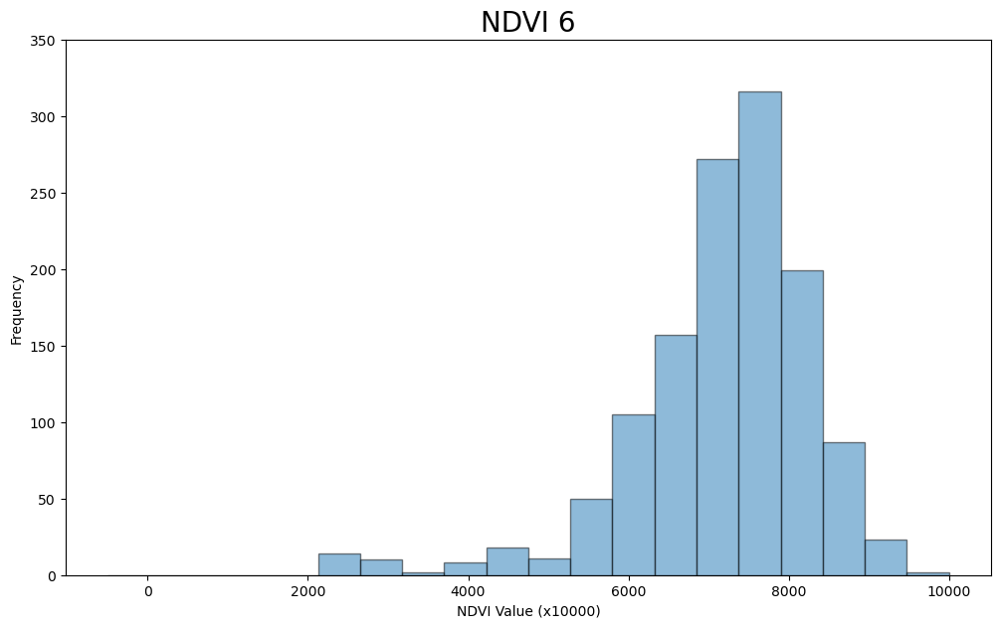

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 6.png



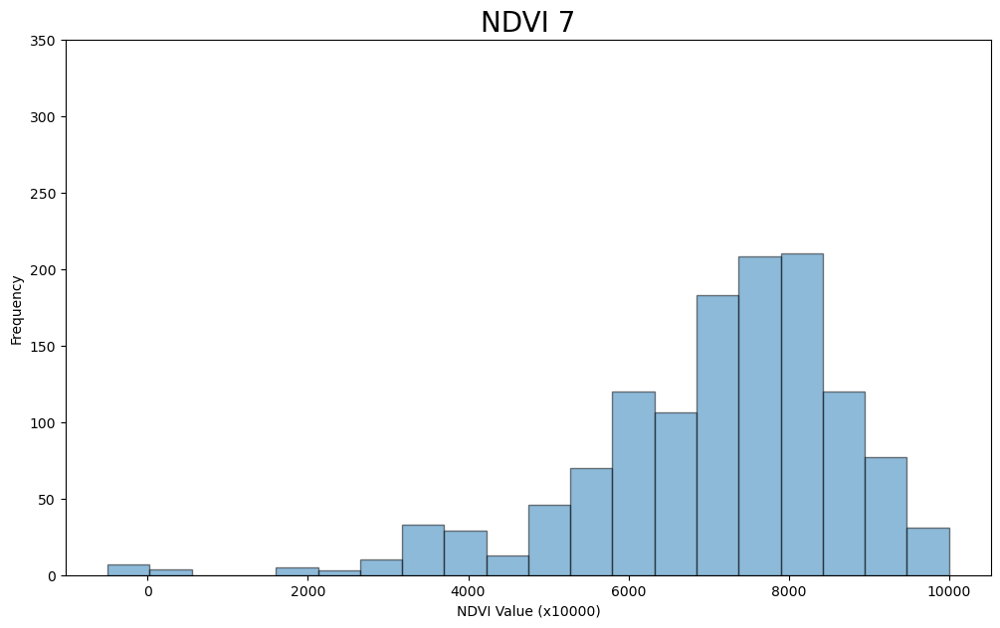

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 7.png



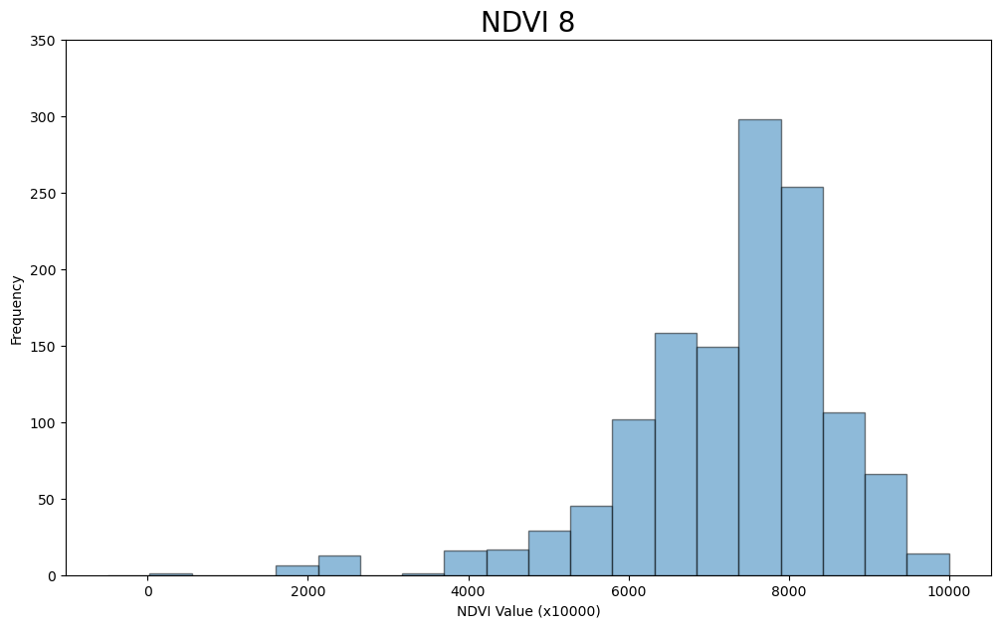

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 8.png



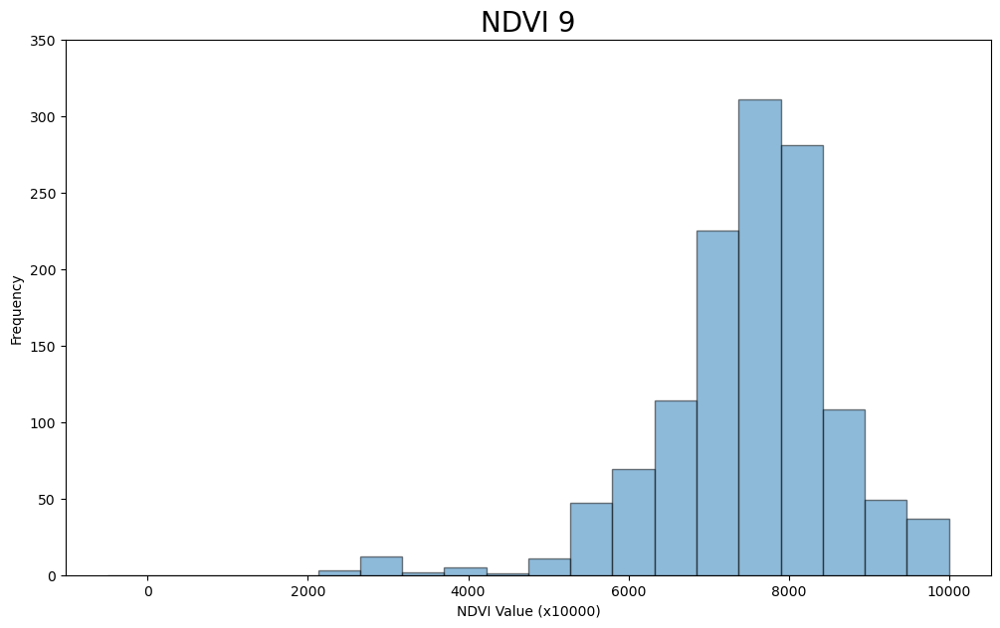

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 9.png



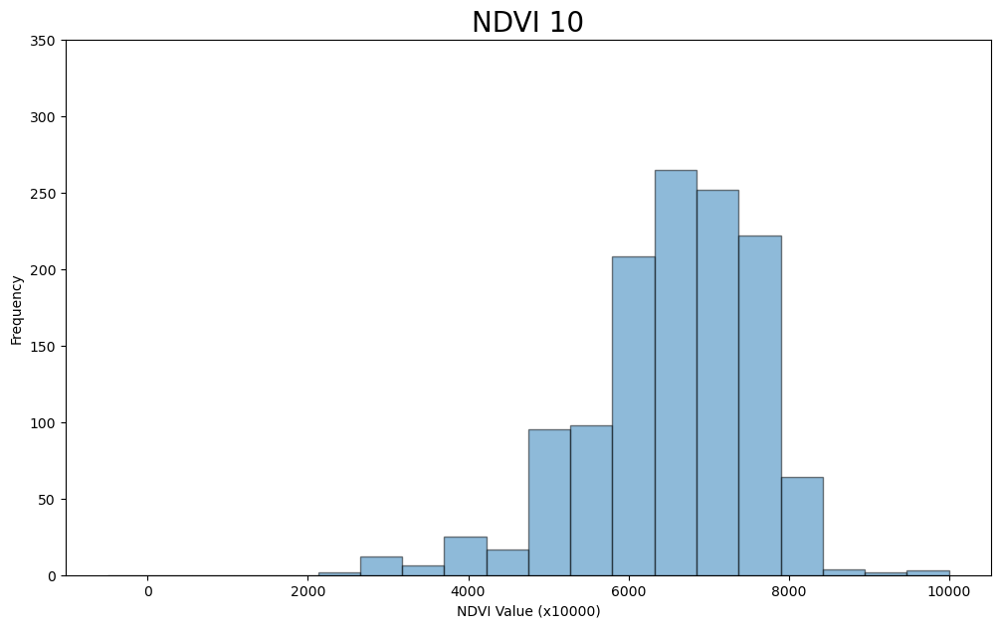

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 10.png



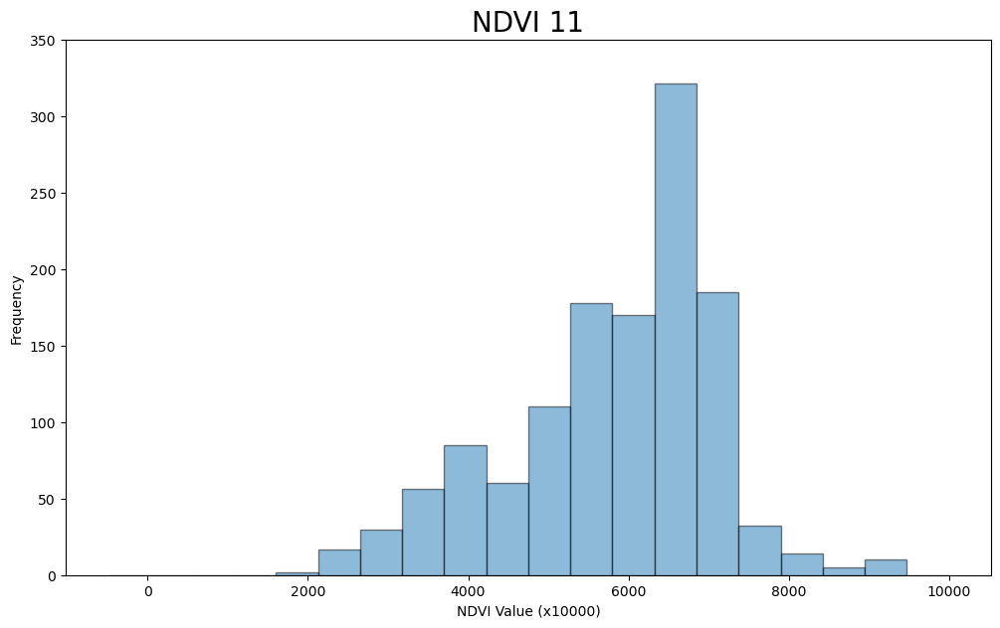

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 11.png



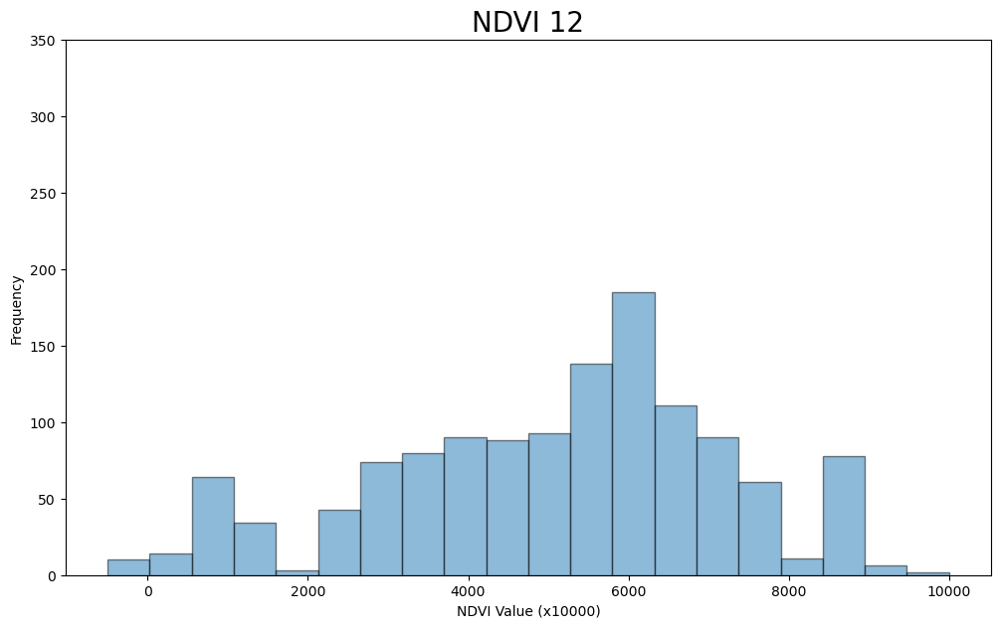

Figure saved here: C:\Users\ericg\IBM_SI\Histograms\NDVI 12.png



In [68]:
# Create NDVI histogram
month = 0
for ndvi in ndviList:
    month += 1
    createHistogram(
        data = ndvi, 
        xmin = -500, 
        xmax = 10000, 
        ymin = 0,
        ymax = 350,
        figsize = (12,7),
        x_title = 'NDVI Value (x10000)', 
        histogram_title = f'NDVI {month}', 
        title_fontsize = 20,
        out_folder = r'C:\Users\ericg\IBM_SI\Histograms')

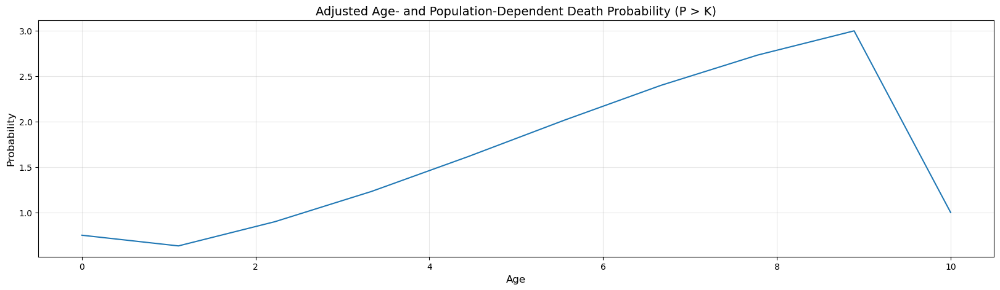

In [106]:
# Define the equation with an additional condition for age < 1
def solve_x_equation_with_condition(x):
    result = (1 / (1 + np.exp(-0.4 * (x - 5)))) * (3 * ((110/100)**2))
    # Apply adjustments for x < 1 and x >= 10
    result = np.where(x < 1, 0.75, result)  # Values under 1 set to 0.75
    result = np.where(x >= 10, 1, result)   # Values 10 or above set to 1
    return result

# Generate values for x
x_values = np.linspace(0, 10, 10)  # Range of x from 0 to 20
y_values = solve_x_equation_with_condition(x_values)  # Calculate y values with condition

# Plot the graph
plt.figure(figsize=(20, 5))
plt.plot(x_values, y_values)
plt.title("Adjusted Age- and Population-Dependent Death Probability (P > K)", fontsize=14)
plt.xlabel("Age", fontsize=12)
plt.ylabel("Probability", fontsize=12)
plt.grid(alpha=0.3)
plt.savefig('Adjusted Age- and Population-Dependent Death Probability (P greater than K) - PPT.png',dpi=300)
plt.show()

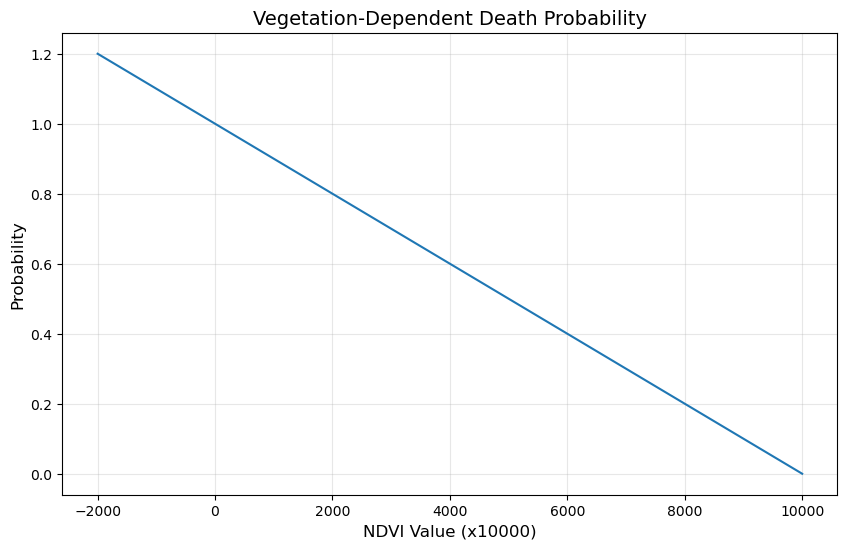

In [7]:
# Define the equation with an additional condition for age < 1
def solve_x_equation_with_condition(x):
    result = 1-(x/10000)
    result = np.where(result < 0, 0, result)
    return result

# Generate values for x
x_values = np.linspace(-2000, 10000, 12000)  # Range of x from 0 to 20
y_values = solve_x_equation_with_condition(x_values)  # Calculate y values with condition

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(x_values, y_values)
plt.title("Vegetation-Dependent Death Probability", fontsize=14)
plt.xlabel("NDVI Value (x10000)", fontsize=12)
plt.ylabel("Probability", fontsize=12)
plt.grid(alpha=0.3)
plt.savefig('Vegetation-Dependent Death Probability.png',dpi=300)
plt.show()

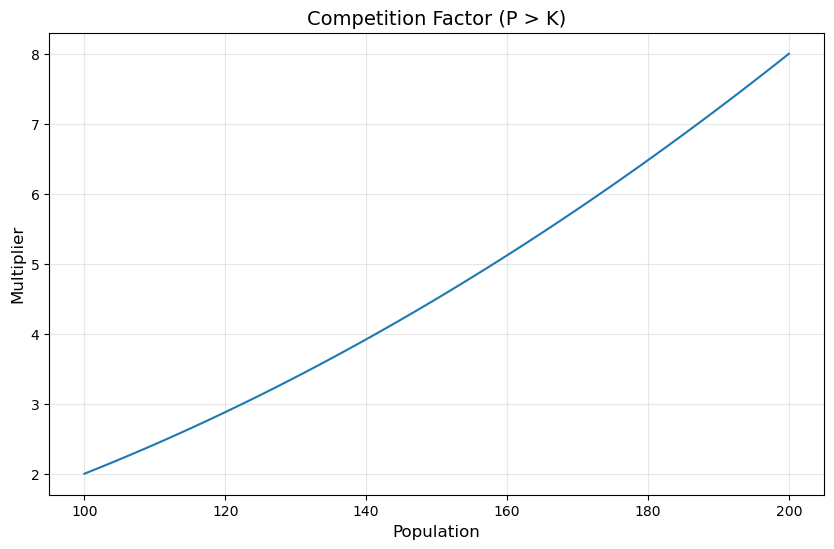

In [3]:
# Define the equation with an additional condition for age < 1
def solve_x_equation_with_condition(x):
    result = 2 * ((x/100)**2)
    result = np.where(x<5,2,result)
    return result

# Generate values for x
x_values = np.linspace(100, 200, 100)  # Range of x from 0 to 20
y_values = solve_x_equation_with_condition(x_values)  # Calculate y values with condition

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(x_values, y_values)
plt.title("Competition Factor (P > K)", fontsize=14)
plt.xlabel("Population", fontsize=12)
plt.ylabel("Multiplier", fontsize=12)
plt.grid(alpha=0.3)
plt.savefig('Competition Factor if P Greater than K.png',dpi=300)
plt.show()

## Setup the Model

In [113]:
# Define a function outside of the IBM to safely sample a raster at a location
def safe_sample(raster, location):

    # If the location is within the bounds of the raster
    if raster.bounds.left <= location[0] <= raster.bounds.right and raster.bounds.bottom <= location[1] <= raster.bounds.top:

        # Set variable equal to the raster cell's value
        value = list(raster.sample([location]))[0][0]

        # Return the value if it is not None
        if value is not None:

            # Return value
            return value

        # Otherwise, return None
        if value is None:

            # Return none
            return None

# Define the Individual class for species
class Individual:

    # Initiate Individual class with x and y values and define the alive function as "alive" because it is an original occurrence
    def __init__(self, age, position, tempKDEs, precKDEs, ndviKDEs, temp_range=1, precip_range=2.5, ndvi_range=100):
        self.age = age
        self.position = position
        self.alive = True
        self.gender = "M" if random.random() < 0.5 else "F" # Initialize gender

        # Sample initial preferences for this individual and add randomness
        self.initial_pref_temp, self.tempPref = self._sample_monthly_prefs(tempKDEs, temp_range)
        self.initial_pref_prec, self.precipPref = self._sample_monthly_prefs(precKDEs, precip_range)
        self.initial_pref_ndvi, self.ndviPref = self._sample_monthly_prefs(ndviKDEs, ndvi_range)
        
    # Helper function to sample preference from KDE and create a range around it
    def _sample_monthly_prefs(self, inKDE, range_value):

        # Create list for intial preferences
        initialPrefs = []

        # Create an empty list to add monthly preferences to
        monthlyPrefs = []
    
        # Iterate through each month
        for kde in inKDE:
        
            # Set initial preference and add randomness
            initial_pref = kde.sample()[0][0]

            # Append initial prefs
            initialPrefs.append(initial_pref)
    
            # Append the range of preferences and add randomness
            monthlyPrefs.append((initial_pref - (random.uniform(range_value,(range_value + (range_value * 0.5)))), initial_pref + (random.uniform(range_value,(range_value + (range_value * 0.5))))))
    
        # Return the monthlyPrefs list
        return initialPrefs, monthlyPrefs

    # Determine if individual is alive
    def is_alive(self):
        return self.alive

    # Function to age the individual annually
    def grow_older(self):
        self.age += 1
    
    # Method to determine if the individual dies
    def check_death(self, avgLifespan, initialPop, popSize, carryingCap, infantMort, precipRasters, tempRasters, ndviRasters):

        # Create a random value and check if number is less and self.alive is false
        deathProb = self.death_prob(self.age, avgLifespan, initialPop, popSize, carryingCap, infantMort, precipRasters, tempRasters, ndviRasters)

        # If the random number is less than the death probability
        if np.random.random() <= deathProb:
            self.alive = False

    # Define a function that kills off more indivduals after the average lifespan
    def death_prob(self, age, avgLifespan, initialPop, popSize, carryingCap, infantMort, precipRasters, tempRasters, ndviRasters):

        # Set a base death probability which increases as it approaches the carrying capacity
        base_death_prob = 1 / (1 + np.exp(-0.3 * (age - avgLifespan)))

        # Add some randomness
        base_death_prob = base_death_prob + random.uniform((base_death_prob * -1),base_death_prob)

        # If the individual is a newborn, the death rate equal the infant mortality rate
        if age < 1:

            # Return infant mortality with some randomness
            return infantMort + random.uniform((infantMort - 1),(1 - infantMort))

        # Sample environmental values for each month
        precip_vals = [
            safe_sample(raster, self.position) for raster in precipRasters
        ]
        temp_vals = [
            safe_sample(raster, self.position) for raster in tempRasters
        ]
        ndvi_vals = [
            safe_sample(raster, self.position) for raster in ndviRasters
        ]

        # Handle missing values by filtering out None
        precip_vals = [val for val in precip_vals if val is not None]
        temp_vals = [val for val in temp_vals if val is not None]
        ndvi_vals = [val for val in ndvi_vals if val is not None]

        # Compute yearly averages or defaults if data is missing
        precip_avg = np.mean(precip_vals) if precip_vals else 100  # Default: high precipitation
        temp_avg = np.mean(temp_vals) if temp_vals else 15  # Default: moderate temperature
        ndvi_avg = np.mean(ndvi_vals) if ndvi_vals else 5000  # Default: moderate NDVI

        # Normalize environmental factors to adjust death probability
        precip_factor = max(0, 1 - precip_avg / 125)  # Higher precip => lower death chance
        temp_factor = min(1, (temp_avg - 15) / 15)  # Higher temp => higher death chance
        ndvi_factor = max(0, 1 - ndvi_avg / 10000)  # Higher NDVI => lower death chance

        # Weighted environmental impact
        env_factor = (precip_factor * 0.75) + (temp_factor * 0.25) + (ndvi_factor * (0.5))

        # If the population is greater than the carrying capacity
        if popSize > carryingCap:

            # Set a variable that holds a higher death rate for more competition
            comp_factor = 3 * ((popSize / carryingCap) ** 2)
    
        # If population size <= carrying capacity, make the output just the original base death probability
        else:

            # Set a variable that holds a lower death rate for less competition
            comp_factor = 1.5 * ((popSize / carryingCap) ** 0.1)

            # If the population size is too low (5% of the initial population), the death rate probability increases
            if popSize <= initialPop * 0.05:

                # Set the comp_factor to a multiplier of 2
                comp_factor = 2
                
        # Set a lower death rate for less competition
        adj_death_prob = base_death_prob * (1 + env_factor) * comp_factor
        
        # Introduce randomness
        adj_death_prob = adj_death_prob + random.uniform(adj_death_prob * -1,adj_death_prob)

        # Return adj_death_probability
        return adj_death_prob
    
    # Get new locations to create a new GDF
    def get_location(self):
        return Point(self.position)

    # Function to move points to raster cell with higher values
    def _move_to_higher_weight(self, precipRasters, tempRasters, ndviRasters, allInds, proximity_weight = 0.5, xMove = 0.00726, yMove = 0.00611):

        # Sample monthly raster values at the current location, using safe_sample
        precip_vals = [safe_sample(precipRaster, self.position) for precipRaster in precipRasters]
        temp_vals = [safe_sample(tempRaster, self.position) for tempRaster in tempRasters]
        ndvi_vals = [safe_sample(ndviRaster, self.position) for ndviRaster in ndviRasters]

        # Filter out None values in case some samples were out of bounds
        precip_vals = [val for val in precip_vals if val is not None]
        temp_vals = [val for val in temp_vals if val is not None]
        ndvi_vals = [val for val in ndvi_vals if val is not None]
            
        # Ensure that we have valid values for all monthly samples
        if not precip_vals or not temp_vals or ndvi_vals is None:
                
            # Handle cases where data is missing; choose to skip moving or set default behavior
            return  # Exit the function if no valid data is found
    
        # Calculate differences between current values and preferences
        precip_diff = abs(np.mean(precip_vals) - np.mean([np.mean(r) for r in self.precipPref]))
        temp_diff = abs(np.mean(temp_vals) - np.mean([np.mean(r) for r in self.tempPref]))
        ndvi_diff = abs(np.mean(ndvi_vals) - np.mean([np.mean(r) for r in self.ndviPref]))

        # Weight the different environmental variables
        weightedNDVI = np.multiply(ndvi_diff, 2)
        weightedPrec = np.multiply(precip_diff, 2)
        weightedTemp = np.multiply(temp_diff, 4)
    
        # Calculate movement direction weighted by the inverse of the difference
        total_diff = weightedPrec + weightedTemp + weightedNDVI

        # If the difference between the mean of cell each point is on and the mean for each raster is greater than 0
        if total_diff > 0:

            # Move point based on distribution of raster cell values and the user-defined maximum distance
            move_x_env = (weightedPrec / total_diff * np.random.uniform(-xMove, xMove) +
                    weightedTemp / total_diff * np.random.uniform(-xMove, xMove) +
                    weightedNDVI / total_diff * np.random.uniform(-xMove, xMove))
    
            move_y_env = (weightedPrec / total_diff * np.random.uniform(-yMove, yMove) +
                    weightedTemp / total_diff * np.random.uniform(-yMove, yMove) +
                    weightedNDVI / total_diff * np.random.uniform(-yMove, yMove))

        # Calculate movement toward the nearest individual
        distances = [(Point(self.position).distance(Point(ind.position)), ind) for ind in allInds if ind != self and ind.alive]

        # If there are any other individuals
        if distances:
            nearest_ind = min(distances, key=lambda x: x[0])
            nearest_distance = nearest_ind[0]
            nearest_position = nearest_ind[1].position

            # Calculate vector toward the nearest individual
            move_x_prox = (nearest_position[0] - self.position[0]) / max(nearest_distance, 1e-6) * proximity_weight * xMove
            move_y_prox = (nearest_position[1] - self.position[1]) / max(nearest_distance, 1e-6) * proximity_weight * yMove

        # If there are no other individuals
        else:
            move_x_prox, move_y_prox = 0, 0

        # Combine environmental and proximity movements
        move_x = move_x_env + move_x_prox
        move_y = move_y_env + move_y_prox
            
        # Update the individual's position
        self.position = (self.position[0] + move_x, self.position[1] + move_y)

# Create a function for the population model
class popModel:

    # Initiate a function for finding the population size
    def __init__(self, speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRasters, species_temp_prefs, species_precip_prefs, species_ndvi_prefs):

        # Intialize the GDF
        self.speciesData = speciesData

        # Initialize temperature prefs
        self.species_temp_prefs = species_temp_prefs

        # Initialize precipitation prefs
        self.species_precip_prefs = species_precip_prefs

        # Initialize temperature prefs
        self.species_ndvi_prefs = species_ndvi_prefs

        # Initialize carrying capacity
        self.carryingCap = carryingCap

        # Initialize the annual birth rate
        self.birthRate = birthRate

        # Initialize average number of births per birth
        self.avgBirths = avgBirths

        # Intialize maximum possible number of births
        self.maxBirths = maxBirths

        # Initialize the average lifespan of the species
        self.avgLifespan = avgLifespan

        # Initialize maximum age
        self.maxAge = maxAge

        # Initialize infant mortality
        self.infantMort = infantMort

        # Initialize precipitation raster
        self.precipRaster = precipRasters

        # Initialize temperature raster
        self.tempRaster = tempRasters

        # Initialize NDVI raster
        self.ndviRaster = ndviRasters

        # Initialize temperature prefs
        self.tempKDEs = tempKDEs

        # Initialize precipitation prefs
        self.precKDEs = precKDEs

        # Initialize temperature prefs
        self.ndviKDEs = ndviKDEs

        # Intialize initial population
        self.initialPop = len(speciesData)

        # Initialize an empty list to add the change in population size over time
        self.pop_over_time = []

        # Initialize timesteps
        self.timeSteps = 0

        # Initialize the population
        self.individuals = self.initPop(speciesData, avgLifespan, maxAge)

        # Initialize wildfire GDF
        self.wildfire_events = gpd.GeoDataFrame(columns=["Year", "Center", "Radius", "geometry"], crs="EPSG:4326")  # GeoDataFrame for wildfire events
    '''
    # Define a function to change the temperture, precipitation, and NDVI over time
    def climate_change_effect(self, temp_increase_rate=0.054, precip_decrease_rate=0.0018, ndvi_decrease_rate=0.012):
        
        # Adjust precipitation rasters
        for i, raster in enumerate(self.precipRasters):
            array = raster.read(1)
            array = array * (1 - precip_decrease_rate)  # Reduce precipitation
            self.precipRasters[i].write(array)

        # Adjust temperature rasters
        for i, raster in enumerate(self.tempRasters):
            array = raster.read(1)
            array = array + temp_increase_per_year  # Add absolute temperature increase
            self.tempRasters[i].write(array)

        # Adjust NDVI rasters based on NDVI values
        for i, raster in enumerate(self.ndviRasters):
            ndvi_array = raster.read(1)
    
            # Apply differential NDVI decrease (lower elevation = greater change in NDVI)
            scaled_ndvi_decrease = ndvi_decrease_rate * (1 - ndvi_array)  # Larger NDVI => slower decrease
            ndvi_array = ndvi_array * (1 - scaled_ndvi_decrease)
    
            self.ndviRasters[i].write(ndvi_array)
    
            print(f"Climate change effects applied for year {self.timeSteps}.")
    '''
    # Initialize population
    def initPop(self, speciesData, avgLifespan, maxAge):

        # Find the lower and upper ends of 50% of the population
        lower = math.floor(0 * maxAge)
        upper = math.ceil(0.5 * maxAge)

        # Calculate mean and standard deviation within the interquartile range
        meanAge = avgLifespan * 0.4 + random.uniform(((avgLifespan * 0.4) * -1),(avgLifespan * 0.4))
        stdDev = (upper - lower) / 2

        # Create a numpy array with ages with distribution created above
        ages = np.random.normal(meanAge, stdDev, len(speciesData))

        # Round all of the ages to the nearest one
        ages = np.round(ages)

        # Make sure all ages are less than or equal to the max age
        ages = np.clip(ages, 0, maxAge)

        # Extract points from GDF
        points = speciesData.geometry.apply(lambda geom: (geom.x, geom.y)).values

        # Assign random coordinates to each point in the GDF
        positions = np.random.choice(points, size = len(speciesData))

        # Return the ages and locations for each individual
        return [Individual(age, pos, self.tempKDEs, self.precKDEs, self.ndviKDEs) for age, pos in zip(ages, positions)]

    # Create code to simulate a year
    def yearSim(self, wildfire_chance=0.1, year=None, outFile=None):

        # Create an empty list for the survivors of each year
        survivors = []

        # Set variable with the population size
        popSize = len(self.individuals)
        '''
        # Trigger a wildfire if a random number is less than the chance a wildfire occurs
        if random.random() < wildfire_chance:
            print(f"Year {year}: Wildfire event triggered!")
            self.trigger_wildfire(self.individuals, year)
        '''
        # Mave all individuals in the dataset
        for individual in self.individuals:

            # If the individual is alive
            if individual.alive:

                # Check if individual is dead
                individual.check_death(self.avgLifespan, popSize, self.initialPop, self.carryingCap, self.infantMort, self.precipRaster, self.tempRaster, self.ndviRaster)

                # If the inidividual is still alive after a year
                if individual.alive:

                    # Age the individual by a year
                    individual.grow_older()

                    # Move the individual
                    individual._move_to_higher_weight(self.precipRaster, self.tempRaster, self.ndviRaster, self.individuals)

                    # Remove any individuals who are now older than the maximum age
                    if individual.age <= self.maxAge:

                        # Add survivors to the empty list
                        survivors.append(individual)

        # Calculate the new births based on birth rate
        newBirths = self.addBirths(survivors, popSize)
    
        # Add the newBirths list to the survivors list
        survivors.extend(newBirths)
    
        # Set individuals to the new survivors of the last year
        self.individuals = survivors
    
        # Add time step
        self.timeSteps += 1
    
        # Add the population over time list
        self.pop_over_time.append(len(self.individuals))

        # Save yearly report
        self.save_yearly_GJ(year, outFile)
    '''
    # Define a function to trigger a wildfire
    def trigger_wildfire(self, inds, year, area_center=None, minRadius=0.03, maxRadius=0.085, mortality_rate=0.7):
    
        # Create a list of all valid NDVI locations
        valid_locations = []

        # For each individual, check NDVI at their position for each month
        for ind in inds:
            if ind.alive:

                # Sample NDVI values for each month at the individual's position
                ndvi_samples = [
                    safe_sample(ndviRaster, ind.position) for ndviRaster in self.ndviRaster
                ]

                # Filter out None values
                ndvi_samples = [val for val in ndvi_samples if val is not None]

                # Calculate mean NDVI for this individual's position
                if ndvi_samples:
                    mean_ndvi = np.mean(ndvi_samples)
                    valid_locations.append((ind.position, mean_ndvi))

        # If valid locations exist, bias the wildfire center toward higher NDVI
        if valid_locations:
            positions, ndvi_values = zip(*valid_locations)

            # Calculate probabilities proportional to NDVI values
            probabilities = [ndvi / sum(ndvi_values) for ndvi in ndvi_values]

            # Select a position for the wildfire center
            area_center = random.choices(positions, weights=probabilities, k=1)[0]
        else:
            # Fallback to a random alive individual's location if no NDVI data is available
            area_center = random.choice([ind.position for ind in individuals if ind.alive])

        # Randomly determine the wildfire radius
        radius = random.uniform(minRadius, maxRadius)

        # Create a circle representing the affected area
        affected_area = Point(area_center).buffer(radius)

        # Set variable for lats and lons for centerpoint of the wildfire
        lat, lon = area_center

        # Add the wildfire event to the GeoDataFrame
        new_event = gpd.GeoDataFrame(
            [{
                "Year": year,
                "Center_Latitude": lat,
                "Center_Longitude": lon,
                "Radius": radius,
                "geometry": affected_area
            }],
            crs="EPSG:4326"
        )
        self.wildfire_events = pd.concat([self.wildfire_events, new_event], ignore_index=True)

        # Apply wildfire mortality
        for ind in inds:
            if ind.alive and Point(ind.position).within(affected_area):
                if random.uniform(0, 1) < mortality_rate:
                    ind.alive = False  # Kill the individual

        print(f"Wildfire triggered! Center: {area_center}, Radius: {radius}, Mortality Rate: {mortality_rate}")
    '''
    # Define a function to save the wildfire events
    def save_all_wildfire_events(self, filename):

        # Save all wildfire events in the simulation
        self.wildfire_events.to_file(filename, driver="GeoJSON")

    # Define a function for adding births at a parent's location
    def addBirths(self, survivors, popSize, male_distance_threshold=0.0095):
        
        # If there is only one individual, no births can occur
        if popSize <= 1:
            print("Population size is 1. No new births allowed.")
            return []
        
        # Create an empty list to add the new individuals
        newInds = []

        # Separate survivors by gender
        males = [ind for ind in survivors if ind.gender == "M" and ind.alive]
        females = [ind for ind in survivors if ind.gender == "F" and ind.alive]

        # Skip birth process if there are no males or females
        if not males or not females:
            print("No males or no females available for reproduction.")
            return newInds

        # For each female, calculate their individual birth probability
        for female in females:
            # Check proximity of males
            male_nearby = any(
                Point(female.position).distance(Point(male.position)) <= male_distance_threshold
                for male in males
            )

            # If no male is nearby, the female cannot give birth
            if not male_nearby:
                continue

            # Calculate the likelihood that the individual would give birth based on age 
            age_birth_prob = self.birthRate * (1 / (1 + np.exp(0.4 * (female.age - self.maxAge))))

            # Add some randomness
            age_birth_prob += random.uniform((age_birth_prob + (age_birth_prob - 1)), (age_birth_prob + (1 - age_birth_prob)))
    
            # If the female gives birth, decide the number of offspring
            if age_birth_prob >= random.uniform(0, 1):
                possibleBirths = np.arange(1, self.maxBirths + 1)
                weights = np.exp(-0.5 * (possibleBirths - self.avgBirths) ** 2)
                weights /= np.sum(weights)

                numBirths = np.random.choice(possibleBirths, p=weights)

                # Create new individuals for each birth
                for _ in range(numBirths):
                    newInd = Individual(
                        age=0, 
                        position=female.position, 
                        tempKDEs=self.tempKDEs,
                        precKDEs=self.precKDEs,
                        ndviKDEs=self.ndviKDEs
                    )
                    newInds.append(newInd)
        
        return newInds

    # Define a function to record preferences
    def save_all_preferences(self, timestep, filename="individual_preferences.csv"):
        
        # Create a list to store preference data for new individuals
        data = []
    
        # Iterate through all individuals
        for ind in self.individuals:
            
            # Check if the individual's preferences have already been saved
            if not hasattr(ind, "preferences_saved") or not ind.preferences_saved:
                
                # Add preferences to the data list
                data.append({
                    "Timestep": timestep,  # When the individual was added
                    "IndividualID": id(ind),  # Unique identifier
                    "Jan_Temp_Preference": ind.initial_pref_temp[0],
                    "Feb_Temp_Preference": ind.initial_pref_temp[1],
                    "Mar_Temp_Preference": ind.initial_pref_temp[2],
                    "Apr_Temp_Preference": ind.initial_pref_temp[3],
                    "May_Temp_Preference": ind.initial_pref_temp[4],
                    "Jun_Temp_Preference": ind.initial_pref_temp[5],
                    "Jul_Temp_Preference": ind.initial_pref_temp[6],
                    "Aug_Temp_Preference": ind.initial_pref_temp[7],
                    "Sep_Temp_Preference": ind.initial_pref_temp[8],
                    "Oct_Temp_Preference": ind.initial_pref_temp[9],
                    "Nov_Temp_Preference": ind.initial_pref_temp[10],
                    "Dec_Temp_Preference": ind.initial_pref_temp[11],
                    "Jan_Prec_Preference": ind.initial_pref_prec[0],
                    "Feb_Prec_Preference": ind.initial_pref_prec[1],
                    "Mar_Prec_Preference": ind.initial_pref_prec[2],
                    "Apr_Prec_Preference": ind.initial_pref_prec[3],
                    "May_Prec_Preference": ind.initial_pref_prec[4],
                    "Jun_Prec_Preference": ind.initial_pref_prec[5],
                    "Jul_Prec_Preference": ind.initial_pref_prec[6],
                    "Aug_Prec_Preference": ind.initial_pref_prec[7],
                    "Sep_Prec_Preference": ind.initial_pref_prec[8],
                    "Oct_Prec_Preference": ind.initial_pref_prec[9],
                    "Nov_Prec_Preference": ind.initial_pref_prec[10],
                    "Dec_Prec_Preference": ind.initial_pref_prec[11],
                    "Jan_NDVI_Preference": ind.initial_pref_ndvi[0],
                    "Feb_NDVI_Preference": ind.initial_pref_ndvi[4],
                    "Mar_NDVI_Preference": ind.initial_pref_ndvi[5],
                    "Apr_NDVI_Preference": ind.initial_pref_ndvi[6],
                    "May_NDVI_Preference": ind.initial_pref_ndvi[7],
                    "Jun_NDVI_Preference": ind.initial_pref_ndvi[8],
                    "Jul_NDVI_Preference": ind.initial_pref_ndvi[9],
                    "Aug_NDVI_Preference": ind.initial_pref_ndvi[10],
                    "Sep_NDVI_Preference": ind.initial_pref_ndvi[11],
                    "Oct_NDVI_Preference": ind.initial_pref_ndvi[1],
                    "Nov_NDVI_Preference": ind.initial_pref_ndvi[2],
                    "Dec_NDVI_Preference": ind.initial_pref_ndvi[3],
                })
                
                # Mark preferences as saved
                ind.preferences_saved = True
    
        # Convert to a DataFrame
        if data:  # Only write if there's new data
            df = pd.DataFrame(data)
    
            # Append to CSV (or create it if it doesn't exist)
            with open(filename, 'a', newline = '') as f:
                df.to_csv(f, index=False, header=f.tell() == 0)  # Write header only if file is new
    
            print(f"Preferences for new individuals saved to {filename}")

    # Define a function to create a yearly GeoJSON report for each individual's age and position
    def save_yearly_GJ(self, year, outFile):
        
        # Collect data for all alive individuals
        features = []
    
        # Iterate through each individual
        for ind in self.individuals:

            # If the individual is alive
            if ind.alive:

                # Extract latitude and longitude
                lat, lon = ind.position
                
                # Create a GeoJSON Feature
                feature = geojson.Feature(
                    geometry=geojson.Point((lat, lon)),  # GeoJSON uses (longitude, latitude) format
                    properties={
                        "Year": year,
                        "IndividualID": id(ind),  # Unique identifier for the individual
                        "Age": ind.age,
                        "Sex": ind.gender
                    }
                )
                features.append(feature)
    
        # Create a GeoJSON FeatureCollection
        feature_collection = geojson.FeatureCollection(features)
    
        # Write the GeoJSON data to the output file
        with open(outFile, 'w') as f:
            geojson.dump(feature_collection, f, indent=2)
    
        print(f"Yearly GeoJSON report for year {year} saved to {outFile}.")

    def createGDF(self):

        # Create variable for alive individuals
        aliveInds = [ind for ind in self.individuals if ind.alive]

        # Create a variable for geometries
        geometry = [ind.get_location() for ind in aliveInds]

        # Create a variable for age
        age = [ind.age for ind in aliveInds]

        # Create geodataframe
        gdf = gpd.GeoDataFrame({'Age':age, 'Geometry':geometry})

        # Set the geometry to where the new point is
        gdf = gdf.set_geometry('Geometry')

        # Return GDF
        return gdf

## Create Simulation

In [22]:
# Simulate the movement of individuals and population growth/decline over a certain number of steps
def runSim(numYears, speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRasters, tempKDEs, precKDEs, ndviKDEs, speciesName, lineGraph, dataFolder, graphFolder, mapFolder):

    simStart = time.time()

    # Set variables equal to the data and graph folders
    dataPath = Path(dataFolder)
    graphPath = Path(graphFolder)
    mapPath = Path(mapFolder)

    # Make the directories
    dataPath.mkdir(parents=True, exist_ok=True)
    graphPath.mkdir(parents=True, exist_ok=True)
    mapPath.mkdir(parents=True, exist_ok=True)

    # Set iteration number to zero
    year = 1

    # Create empty lists for years and population number
    yearList = []
    popList = []

    # Append initial year and population to each list
    yearList.append('Start')
    popList.append(f'{len(speciesData)}')

    # Create the model in the sim
    model = popModel(speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRasters, tempKDEs, precKDEs, ndviKDEs)

    fig, ax = plt.subplots(figsize=(12,8))
    speciesData.plot(ax=ax, marker='o', color='blue', label='Species Locations', alpha=0.6)

    # Set axis limits
    ax.set_xlim([-110.15, -109.75])  # Minimum and maximum x values
    ax.set_ylim([32.575, 32.825])   # Minimum and maximum y values
    
    # Add a satellite basemap
    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs='EPSG:4326')

    # Add legend and title
    plt.legend()
    plt.title(f"Initial Locations of {speciesName}")

    # Save the plot
    plt.savefig(os.path.join(mapFolder,f'Initial Population.png'), dpi=300)
    
    plt.show()

    print(f'Starting population: {len(speciesData)}')
    print('')
    
    # Run the simulation for a user-defined amount of time
    for i in range(0,numYears):

        # Run model sim with wildfire possibility
        model.yearSim(
            wildfire_chance=0.1,
            year=year,
            outFile=os.path.join(dataFolder,f'individual_locations_year_{year}.geojson')
        )

        # Save preference data
        model.save_all_preferences(timestep=i,filename=os.path.join(dataFolder,"individual_preferences.csv"))

        # Create new GDF from simulated data
        gdf = model.createGDF()

        # If there are no more individuals left, end the simulation
        if len(gdf) == 0:
            print(f"Simulation ended early: Population went extinct in year {str(year).zfill(2)}.")
            break

        print(f'Year {i + 1} population: {len(gdf)}')

        # Plot the initial and final positions of individuals
        fig, ax = plt.subplots(figsize=(12,8))
        gdf.plot(ax=ax, marker='o', color='blue', label='Species Locations', alpha=0.6)

        # Set axis limits
        ax.set_xlim([-110.15, -109.75])  # Minimum and maximum x values
        ax.set_ylim([32.575, 32.825])   # Minimum and maximum y values

        # Add a satellite basemap
        ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs='EPSG:4326')

        # Add legend and title
        plt.legend()
        plt.title(f"Year {i + 1} Locations of {speciesName}")

        # Save the plot
        plt.savefig(os.path.join(mapFolder,f'Individual Locations - Year {str(year).zfill(2)}.png'), dpi=300)

        # Show the plot
        plt.show()

        # Append year and population numbers to lists
        yearList.append(f'{i}')
        popList.append(f'{len(gdf)}')

        runEnd = time.time()

        runTime = runEnd - simStart

        runTime_hms = str(timedelta(seconds = runTime))

        print(f'Year {i + 1} simulation time - {runTime_hms}')
        print('')

        # Add one for each iteration
        year += 1

    # Convert all values in popList to float
    popList = [float(pop) for pop in popList]

    # Set up the plot to save and display
    plt.figure(figsize=(16, 5))
    plt.plot(yearList, popList, marker='o', linestyle='-', color='b', label='Population')

    # Set variables for the maximum and minimum y values on the graph
    ymin = round(min(popList) - 50, -1)
    ymax = round(max(popList) + 50, -1)

    # Set minimum and maximum values for y-axis
    ax.set_ylim(bottom = ymin, top = ymax)

    # Make the y-axis continuous
    ax.set_yticks(np.arange(ymin,ymax,50))
    
    # Customize the plot
    plt.title('Population Over Time')
    plt.xlabel('Year')
    plt.ylabel('Population')
    plt.grid(True)
    plt.legend()

    # Save the plot
    plt.savefig(os.path.join(graphFolder,f'{lineGraph}.png'), dpi = 300, bbox_inches = 'tight')
    
    # Display the plot
    plt.show()

    # Save all wildfire events to a GeoJSON file
    model.save_all_wildfire_events(os.path.join(dataFolder,"all_wildfire_events.geojson"))

    # Set the coordinate system to WGS 84
    speciesData.set_crs(epsg=4326)
    gdf.set_crs(epsg=4326)

    # Create a GeoJSON from both GDFs
    speciesData.to_file('initialPop.geojson', driver = 'GeoJSON')
    gdf.to_file('finalPop.geojson', driver = 'GeoJSON')

    simEnd = time.time()

    simTime = simEnd - simStart

    simTime_hms = str(timedelta(seconds = simTime))

    print('')
    print('Simulation complete.')
    print(f'Simulation runtime - {simTime_hms}')

## Set variables for each raster used

In [23]:
# Create empty lists for temperature, precipitation, and NDVI
precRast_list = []
tempRast_list = []
ndviRast_list = []

# Iterate through the raster list
for rast in rastList:

    # Set a variable equal to the file name
    fileName = rast[0]

    # If the file is a precipitation raster
    if 'Precipitation' in fileName:

        # Append the file to the precList
        precRast_list.append(fileName)

    # If the file is a temperature raster
    if 'Temperature' in fileName:

        # Append the file to the tempList
        tempRast_list.append(fileName)

    # If the file is an NDVI raster
    if 'NDVI' in fileName:

        # Append the file to the ndviList
        ndviRast_list.append(fileName)

# Set variables for rasters
tempRasts = [rasterio.open(path) for path in tempRast_list]
precRasts = [rasterio.open(path) for path in precRast_list]
ndviRasts = [rasterio.open(path) for path in ndviRast_list]

## Set up Kernel Density Model for each environmental variable

In [24]:
# Precompute KDEs of each environmental variable (can increase the processing time when inside IBM)

# Change prefs lists to numpy array
tempArray = np.array(tempList)
precArray = np.array(precList)
ndviArray = np.array(ndviList)

# Set up empty lists to add KDE values to
tempKDEs = []
precKDEs = []
ndviKDEs = []

# Iterate through each month
for month in range(12):

    # Set up KDE for temp and precip
    tempKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(tempArray[month].reshape(-1, 1))
    precKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(precArray[month].reshape(-1, 1))
    ndviKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(ndviArray[month].reshape(-1, 1))

    # Append KDE to the empty lists
    tempKDEs.append(tempKDE)
    precKDEs.append(precKDE)
    ndviKDEs.append(ndviKDE)

## Initialize Starting Population

In [60]:
def gen_random_pts(polygon, numPts, input_points_gdf, max_distance):
    
    # Create an empty list to add points
    points = []

    # Extract geometry from the input points GeoDataFrame
    input_points = input_points_gdf.geometry.tolist()

    # Find bounds of the polygon
    bounds = polygon.total_bounds

    # As long as the number of points is less than the desired number
    while len(points) < numPts:
        # Generate random x and y within the bounding box
        random_x = np.random.uniform(bounds[0], bounds[2])
        random_y = np.random.uniform(bounds[1], bounds[3])
        random_point = Point(random_x, random_y)

        # Check if the point is within the polygon
        if polygon.contains(random_point).any():
            # Check if the random point is within the maximum distance of any input point
            if any(random_point.distance(p) <= max_distance for p in input_points):
                points.append(random_point)

    # Create a GeoDataFrame from the points
    gdf_points = gpd.GeoDataFrame(geometry=points, crs="EPSG:4326")

    # Return the output GeoDataFrame
    return gdf_points

In [61]:
# Define a function to add individuals on the sky island based on current population
def addInds(gdf,polygon,num_of_inds,max_dist):

    # Subtract the current number of individuals by the length of the geodataframe to find the number of random individuals to add
    randomNum = num_of_inds - len(gdf)

    # Generate random points within the input polygon
    randPts = gen_random_pts(polygon,randomNum,gdf,max_dist)

    # Add individuals to the previous GDF
    updated_gdf = pd.concat([gdf,randPts],ignore_index=True)

    # Return the updated GDF
    return updated_gdf

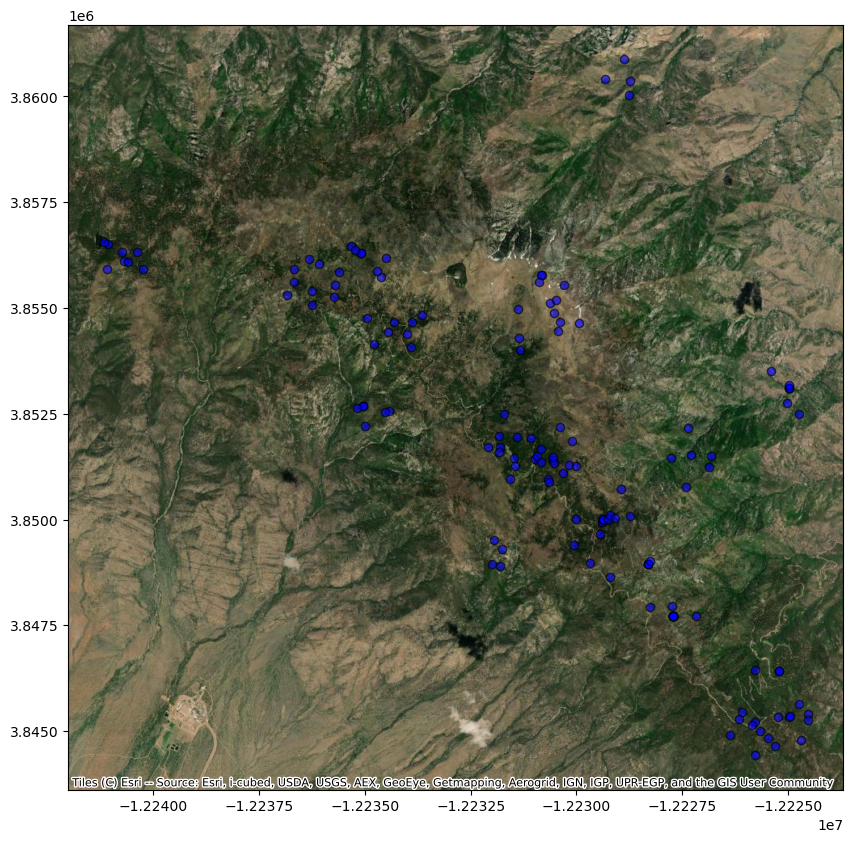

In [64]:
# Create updated GDF
mt_graham = addInds(mt_graham_red_squirrel,pinaleno,144,0.00611)

# Convert features to EPSG:3857 for Web Mercator
f3857 = mt_graham.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Mount Graham Red Squirrel Individuals")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

## Run Simulation

KeyboardInterrupt: 

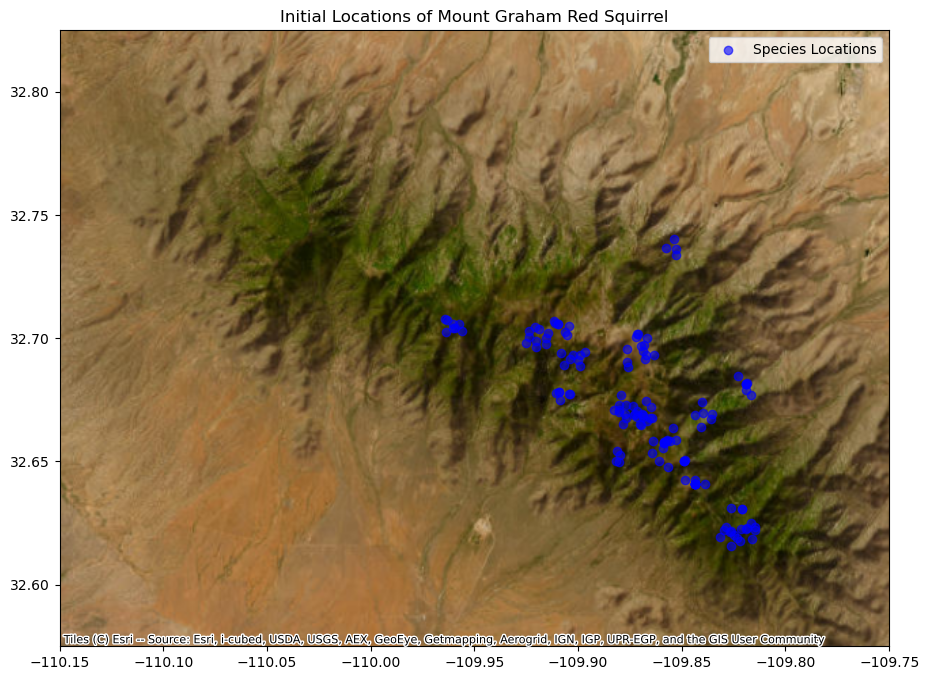

In [77]:
# First Simulation
runSim(
    numYears = 76,
    speciesData = mt_graham,
    carryingCap = 250,
    birthRate = .475,
    avgBirths = 4,
    maxBirths = 8,
    avgLifespan = 5,
    speciesName = "Mount Graham Red Squirrel",
    maxAge = 10,
    infantMort = 0.75,
    precipRasters = precRasts,
    tempRasters = tempRasts,
    ndviRasters = ndviRasts,
    tempKDEs = tempKDEs, 
    precKDEs = precKDEs, 
    ndviKDEs = ndviKDEs,
    lineGraph = 'Sim 0 of Climate Change Simulations',
    dataFolder = r'Climate Change Simulations\Sim 0\Data',
    graphFolder = r'Climate Change Simulations\Sim 0\Graphs',
    mapFolder = r'Climate Change Simulations\Sim 0\Maps'
)

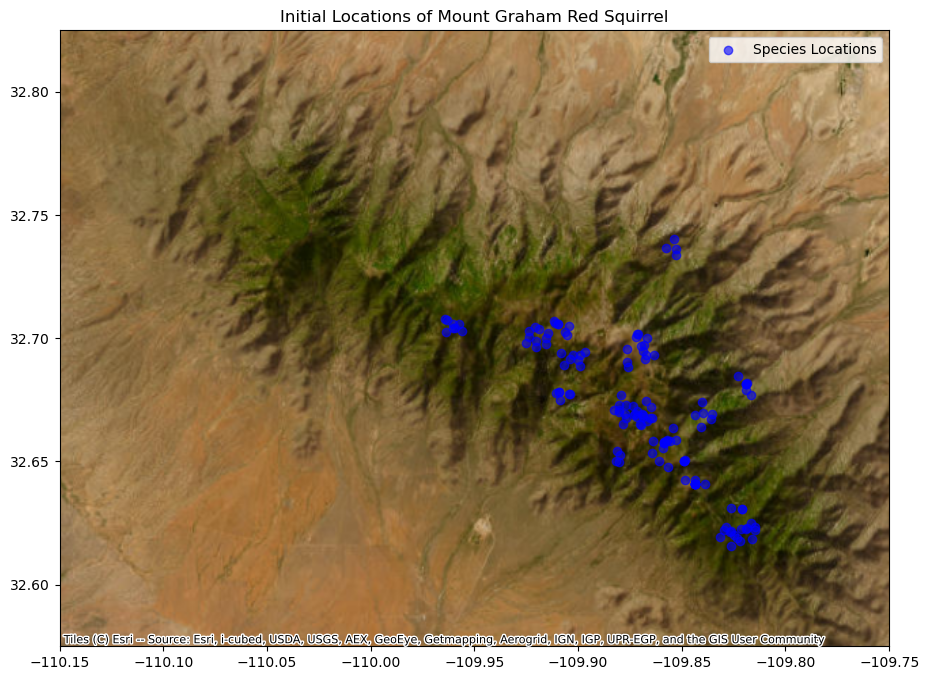

Starting population: 144

Yearly GeoJSON report for year 1 saved to Non-Climate Change Simulations\Sim 0\Data\individual_locations_year_1.geojson.
Preferences for new individuals saved to Non-Climate Change Simulations\Sim 0\Data\individual_preferences.csv
Year 1 population: 158


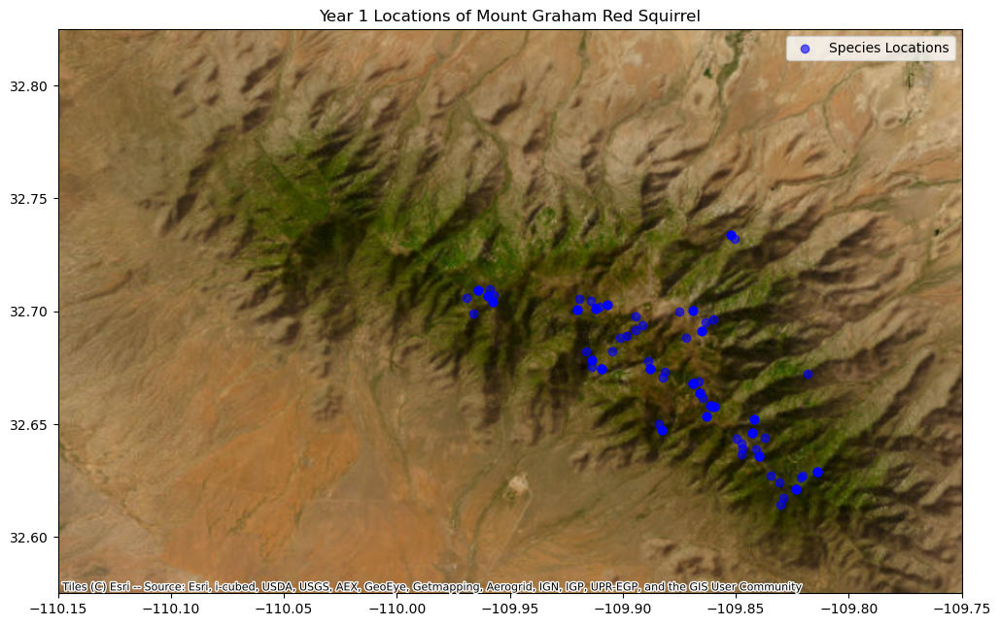

Year 1 simulation time - 0:00:14.983844

Yearly GeoJSON report for year 2 saved to Non-Climate Change Simulations\Sim 0\Data\individual_locations_year_2.geojson.
Preferences for new individuals saved to Non-Climate Change Simulations\Sim 0\Data\individual_preferences.csv
Year 2 population: 146


In [ ]:
# First Simulation
runSim(
    numYears = 76,
    speciesData = mt_graham,
    carryingCap = 260,
    birthRate = .85,
    avgBirths = 4,
    maxBirths = 8,
    avgLifespan = 5,
    speciesName = "Mount Graham Red Squirrel",
    maxAge = 10,
    infantMort = 0.75,
    precipRasters = precRasts,
    tempRasters = tempRasts,
    ndviRasters = ndviRasts,
    tempKDEs = tempKDEs, 
    precKDEs = precKDEs, 
    ndviKDEs = ndviKDEs,
    lineGraph = 'Sim 0 of Non-Climate Change Simulations',
    dataFolder = r'Non-Climate Change Simulations\Sim 0\Data',
    graphFolder = r'Non-Climate Change Simulations\Sim 0\Graphs',
    mapFolder = r'Non-Climate Change Simulations\Sim 0\Maps'
)

In [21]:
# Define a function to create a GIF of all of the simulations
def createGIF(inFolder,outputGIF,fps):

    # Get a list of image files in the folder, sorted by filename
    images = sorted(
        [os.path.join(inFolder, file) for file in os.listdir(inFolder) if file.endswith(('png', 'jpg', 'jpeg'))]
    )

    # Make the initial population the first image in the gif
    image = images[:len(images)-1]
    true_images = images[len(images)-1:]
    true_images.extend(image)
    
    # Read all images into a list
    frames = [iio.imread(i) for i in true_images]

    # Create the GIF
    iio.imwrite(outputGIF, frames, format="GIF", duration=(1/fps), loop=0)  # Adjust duration for frame speed

    print(f"GIF saved as {outputGIF}")

In [22]:
createGIF(r'Climate Change Simulations\Sim 0\Maps',r'Climate Change Simulations\Sim 0\Simulation GIF Py.gif',4)

GIF saved as Climate Change Simulations\Sim 0\Simulation GIF Py.gif


In [72]:
# Load GeoJSON files into GeoDataFrames
gdf1 = gpd.read_file('initialPop.geojson')  # Replace with your file path
gdf2 = gpd.read_file('finalPop.geojson')  # Replace with your file path

# Create a base map centered on the mean of the coordinates of the first GeoDataFrame
center_coords = [gdf1.geometry.y.mean(), gdf1.geometry.x.mean()]
m = folium.Map(location=center_coords, zoom_start=7)

# Add satellite basemap from Esri
folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri",
    name="Esri Satellite",
    overlay=False,
    control=True
).add_to(m)

# Add first GeoDataFrame points with color 'blue'
for _, row in gdf1.iterrows():
    if isinstance(row.geometry, Point):  # Only add point geometries
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=1,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(m)

# Add second GeoDataFrame points with color 'red'
for _, row in gdf2.iterrows():
    if isinstance(row.geometry, Point):  # Only add point geometries
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=1,
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.6
        ).add_to(m)

# Add a layer control to toggle between layers
folium.LayerControl().add_to(m)

# Save the map to an HTML file
m.save('Initial and Final Individual Positions.html')

# If you're in a Jupyter notebook, display the map
m